# Try to add a nifty model for sampling the input map

numpy version: 2.1.1


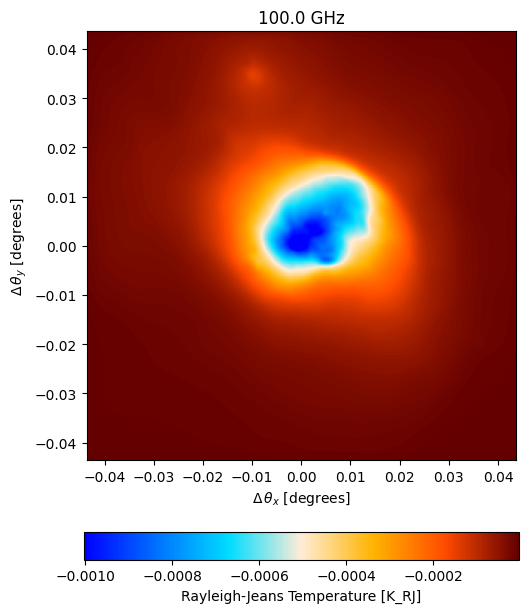

In [1]:
import numpy as np
print(f"numpy version: {np.__version__}")
import matplotlib.pyplot as plt
import maria
import sys
import os

# Relative import of sample_maps for now
sys.path.append(os.path.abspath('../python'))
import mapsampling_jax
from mapsampling_jax import sample_maps

map_filename = maria.io.fetch("maps/cluster.fits")

# load in the map from a fits file
input_map = maria.map.read_fits(filename=map_filename, #filename
                                resolution=8.714e-05, #pixel size in degrees
                                index=0, #index for fits file
                                center=(150, 10), # position in the sky
                                units='Jy/pixel' # Units of the input map 
                               )

input_map.to(units="K_RJ").plot()

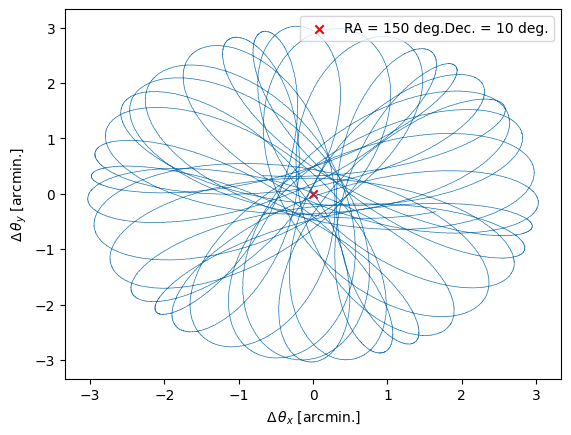

In [2]:
#load the map into maria
plan = maria.get_plan(scan_pattern="daisy", # scanning pattern
                      scan_options={"radius": 0.05, "speed": 0.01}, # in degrees
                      duration=600, # integration time in seconds
                    # duration=60,
                    #   duration=300, # integration time in seconds
                      sample_rate=50, # in Hz
                      scan_center=(150, 10), # position in the sky
                      frame="ra_dec")

plan.plot()

2024-10-31 15:46:45.804 INFO: Initialized base in 1616 ms.
Building atmosphere: 100%|██████████| 6/6 [00:04<00:00,  1.36it/s]
2024-10-31 15:46:51.607 INFO: Initialized atmosphere in 5788 ms.
Generating noise: 100%|██████████| 1/1 [00:00<00:00,  2.17it/s]


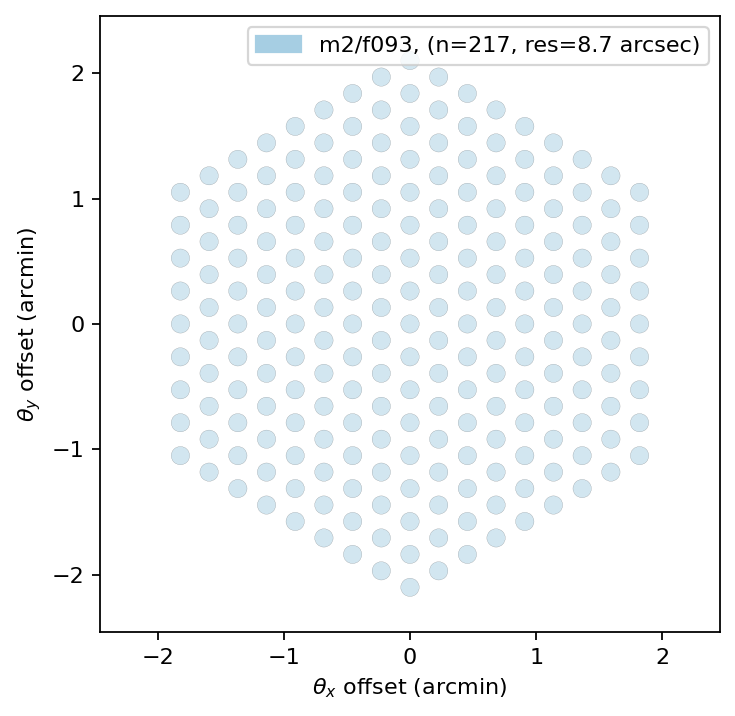

In [3]:
# instrument = maria.get_instrument('MUSTANG-2')
instrument = mapsampling_jax.instrument
instrument.plot()

sim_truthmap = maria.Simulation(instrument, 
                                plan=plan,
                                site="llano_de_chajnantor", 
                                map=input_map,
                                # noise=False,
                                atmosphere="2d",
                                # cmb="generate",
                                )

tod_truthmap = sim_truthmap.run()

In [4]:
dx, dy = sim_truthmap.coords.offsets(frame=sim_truthmap.map.frame, center=sim_truthmap.map.center)
dx = dx.compute()
dy = dy.compute()

Running mapper (m2/f093): 100%|██████████| 1/1 [00:05<00:00,  5.99s/it]


mapdata_truth shape: (1, 1, 1000, 1000)
mapdata_truth mean: -8.726028151723567e-05


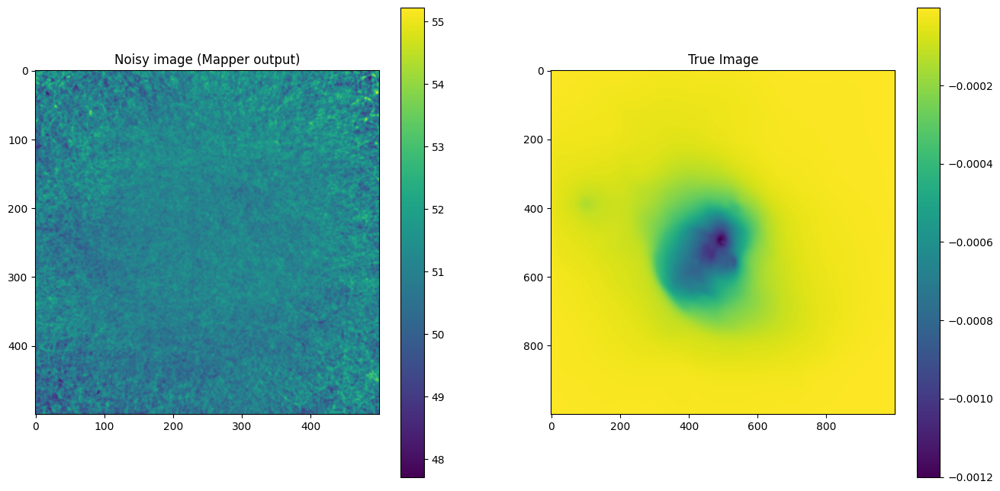

In [5]:
from maria.mappers import BinMapper

# Run mapper without any filtering to get noisy mimge
mapper_truthmap = BinMapper(center=(150, 10), frame="ra_dec", width=0.1, height=0.1, resolution=2e-4, map_postprocessing={"gaussian_filter": {"sigma": 1}} )
mapper_truthmap.add_tods(tod_truthmap)
output_truthmap = mapper_truthmap.run()

mapdata_truth = np.float64(sim_truthmap.map.data)
mapdata_truth = np.nan_to_num(mapdata_truth, nan=np.nanmean(mapdata_truth)) # replace nan value by img mean

print("mapdata_truth shape:", mapdata_truth.shape)
print("mapdata_truth mean:", mapdata_truth.mean())

fig, axes = plt.subplots(1, 2, figsize=(16, 8))

im0 = axes[0].imshow(output_truthmap.data[0].T)
fig.colorbar(im0)
axes[0].title.set_text("Noisy image (Mapper output)")

im1 = axes[1].imshow(mapdata_truth[0, 0])
fig.colorbar(im1)
axes[1].title.set_text("True Image")

plt.show()

# Re-implement map sampling in JAX for nifty response function:

In [6]:
os.environ['CUDA_VISIBLE_DEVICES'] = '2'

import jax
from jax import random
import jax.numpy as jnp

import nifty8.re as jft
import matplotlib.pyplot as plt

import numpy as np

from functools import reduce
from operator import or_

seed = 42
key = random.PRNGKey(seed)

2024-10-31 15:47:06.790 INFO: Unable to initialize backend 'rocm': module 'jaxlib.xla_extension' has no attribute 'GpuAllocatorConfig'
2024-10-31 15:47:06.792 INFO: Unable to initialize backend 'tpu': INTERNAL: Failed to open libtpu.so: libtpu.so: cannot open shared object file: No such file or directory


# Test TOD agreement:

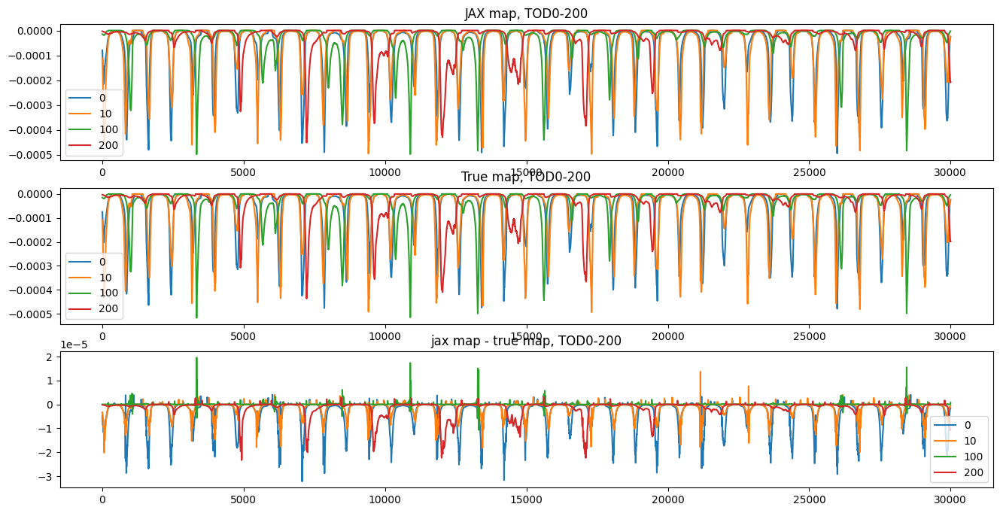

In [7]:
jax_tods_map = sample_maps(mapdata_truth, dx, dy, sim_truthmap.map.resolution, sim_truthmap.map.x_side, sim_truthmap.map.y_side)

fig, axes = plt.subplots(3, 1, figsize=(16, 8))

for i in [0, 10, 100, 200]:
    im0 = axes[0].plot(jax_tods_map[i], label=i)

    tods_map = np.float64(tod_truthmap.get_field('map').compute())
    im1 = axes[1].plot(tods_map[i], label=i)

    im2 = axes[2].plot(jax_tods_map[i] - tods_map[i], label=i)
    
axes[0].title.set_text(f'JAX map, TOD0-{i}')
axes[0].legend()
axes[1].title.set_text(f'True map, TOD0-{i}')
axes[1].legend()
axes[2].title.set_text(f'jax map - true map, TOD0-{i}')
axes[2].legend()

plt.show()

# Prepare noised input TODs:

Noise stddev: 0.0002516883517087084


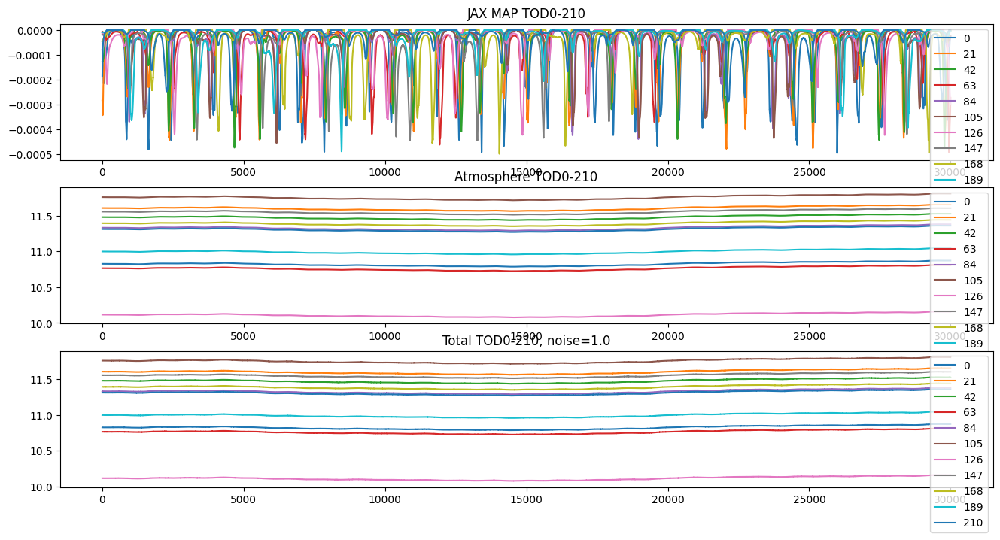

In [8]:
# Pick noise level for rest of run:
# noiselevel = 0.0
# noiselevel = 0.1
# noiselevel = 0.5
noiselevel = 1.0

# Add n TODs for atmos:
n = jax_tods_map.shape[0]

jax_tods_atmos = tod_truthmap.get_field('atmosphere')
# noised_jax_tod = np.float64(jax_tods_map) + np.float64(jax_tods_atmos) + np.float64(tod_truthmap.components['noise']*noiselevel)

noised_jax_tod = np.float64(jax_tods_map) + np.float64(tod_truthmap.get_field('noise')*noiselevel)
# noised_jax_tod = np.float64(tod_truthmap.get_field('noise')*noiselevel)
noised_jax_tod[:n] += np.float64(jax_tods_atmos[:n]) 

denoised_jax_tod = noised_jax_tod - np.float64(tod_truthmap.get_field('noise')*noiselevel)

print("Noise stddev:", np.std(tod_truthmap.get_field('noise').compute()))

fig, axes = plt.subplots(3, 1, figsize=(16, 8))

for i in range(0, n, n//10):
    im0 = axes[0].plot(jax_tods_map[i], label=i)
    im1 = axes[1].plot(jax_tods_atmos[i], label=i)
    im2 = axes[2].plot(noised_jax_tod[i], label=i)
    
axes[0].title.set_text(f'JAX MAP TOD0-{i}')
axes[0].legend()
axes[1].title.set_text(f'Atmosphere TOD0-{i}')
axes[1].legend()
axes[2].title.set_text(f'Total TOD0-{i}, noise={noiselevel}')
axes[2].legend()

plt.show()

## Test atmosphere slopes:

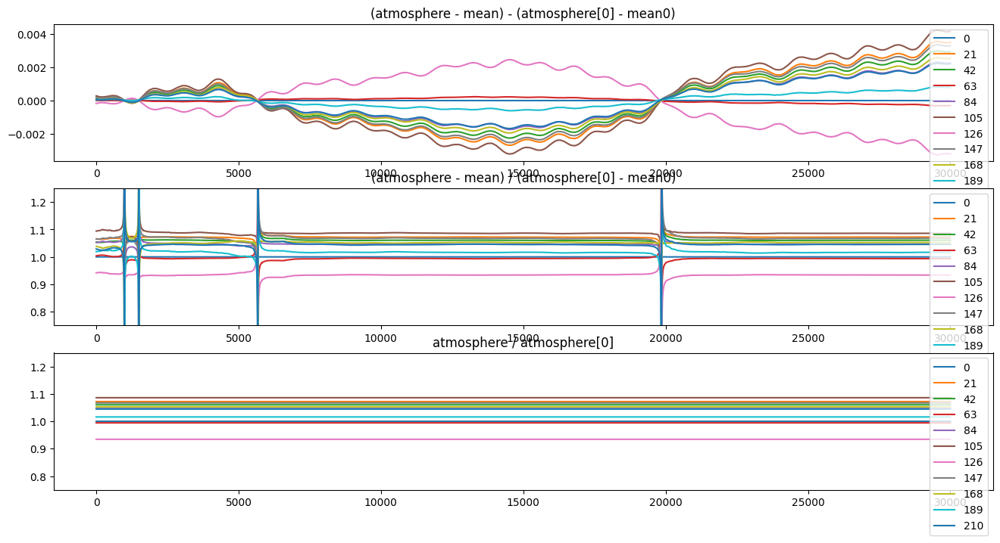

In [9]:
fig, axes = plt.subplots(3, 1, figsize=(16, 8))

for i in range(0, n, n//10 if n//10 != 0 else 1):
    axes[0].plot(jax_tods_atmos[i] - jax_tods_atmos[i].mean() - (jax_tods_atmos[0] - jax_tods_atmos[0].mean()), label=i)
    axes[1].plot( (jax_tods_atmos[i] - jax_tods_atmos[i].mean()) / (jax_tods_atmos[0] - jax_tods_atmos[0].mean()), label=i)
    axes[2].plot(jax_tods_atmos[i]/jax_tods_atmos[0], label=i)
    
axes[0].title.set_text(f'(atmosphere - mean) - (atmosphere[0] - mean0)')
axes[0].legend()
axes[1].title.set_text(f'(atmosphere - mean) / (atmosphere[0] - mean0)')
axes[1].legend()
axes[1].set_ylim([0.75, 1.25])
axes[2].title.set_text(f'atmosphere / atmosphere[0]')
axes[2].legend()
axes[2].set_ylim([0.75, 1.25])

plt.show()

In [10]:
print("real slopes:")
# slopes_truth = (jax_tods_atmos - jax_tods_atmos.mean(axis=1)[:, None]) / (jax_tods_atmos[0] - jax_tods_atmos[0].mean())
slopes_truth = (jax_tods_atmos) / (jax_tods_atmos[0])
slopes_truth = np.float64(slopes_truth.mean(axis=1))
print(slopes_truth.shape)

real slopes:
(217,)


np.float64(-1.1909586885551845e-14)

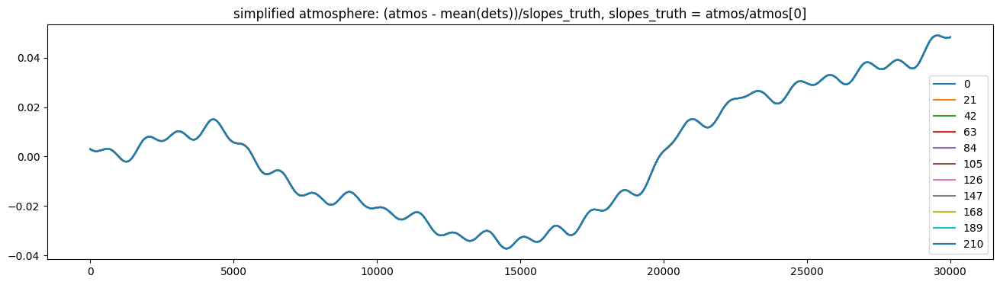

In [11]:
fig, axes = plt.subplots(1, 1, figsize=(16, 4))

# slopes_truth = (jax_tods_atmos - jax_tods_atmos.mean(axis=1)[:, None]) / (jax_tods_atmos[0] - jax_tods_atmos[0].mean())
# slopes_truth = (jax_tods_atmos - jax_tods_atmos.mean()) / (jax_tods_atmos[0] - jax_tods_atmos.mean())

offset_tod_truth = np.float64(jax_tods_atmos.mean(axis=1))

atmos_tod_simplified = (jax_tods_atmos - offset_tod_truth[:, None])/slopes_truth[:, None]

for i in range(0, n, n//10 if n//10 != 0 else 1):
    # axes[0].plot( (jax_tods_atmos[i] - jax_tods_atmos[i].mean())/slopes_truth[i], label=i)
    axes.plot( atmos_tod_simplified[i], label=i)

axes.title.set_text(f'simplified atmosphere: (atmos - mean(dets))/slopes_truth, slopes_truth = atmos/atmos[0]')
axes.legend()

atmos_tod_simplified.mean().compute()

# Next, initialise nifty prior model

Start with the atmosphere TOD model. For this, we need to re-write the CorrelatedFieldMaker:

In [12]:
import jax

import jax.numpy as jnp
import numpy as np
import nifty8.re as jft
import matplotlib.pyplot as plt

from functools import partial
from nifty8.re.correlated_field import Model, RegularCartesianGrid, hartley, HEALPixGrid, get_sht, ShapeWithDtype, random_like

key = jax.random.PRNGKey(42)

In [13]:
class CFM(jft.CorrelatedFieldMaker):
    def __init__(self, prefix):
        super().__init__(prefix)

    def finalize(self, n_fields: int = 0) -> Model:
        """Finishes off the model construction process and returns the
        constructed operator.
        """
        harmonic_transforms = []
        excitation_shape = ()
        for sgrid in self._target_grids:
            sub_shp = None
            sub_shp = sgrid.harmonic_grid.shape
            excitation_shape += sub_shp
            n = len(excitation_shape)
            harmonic_dvol = 1.0 / sgrid.total_volume
            if isinstance(sgrid, RegularCartesianGrid):
                axes = tuple(range(n - len(sub_shp), n))
                # TODO: Generalize to complex
                trafo = partial(hartley, axes=axes)
            elif isinstance(sgrid, HEALPixGrid):
                axis = len(excitation_shape) - 1
                trafo = get_sht(
                    nside=sgrid.nside,
                    axis=axis,
                    lmax=sgrid.harmonic_grid.lmax,
                    mmax=sgrid.harmonic_grid.mmax,
                    nthreads=1,
                )
            harmonic_transforms.append((harmonic_dvol, trafo))

        # Register the parameters for the excitations in harmonic space
        # TODO: actually account for the dtype here
        pfx = self._prefix + "xi"
        if n_fields > 0:
            xi_shape = (n_fields,) + excitation_shape
        else:
            xi_shape = excitation_shape
        self._parameter_tree[pfx] = ShapeWithDtype(xi_shape)

        def outer_harmonic_transform(p):
            harmonic_dvol, ht = harmonic_transforms[0]
            outer = harmonic_dvol * ht(p)
            for harmonic_dvol, ht in harmonic_transforms[1:]:
                outer = harmonic_dvol * ht(outer)
            return outer

        def _mk_expanded_amp(amp, sub_dom):  # Avoid late binding
            def expanded_amp(p):
                return amp(p)[sub_dom.harmonic_grid.power_distributor]

            return expanded_amp

        expanded_amplitudes = []
        namps = self.get_normalized_amplitudes()
        for amp, sgrid in zip(namps, self._target_grids):
            expanded_amplitudes.append(_mk_expanded_amp(amp, sgrid))

        def outer_amplitude(p):
            outer = expanded_amplitudes[0](p)
            for amp in expanded_amplitudes[1:]:
                # NOTE, the order is important here and must match with the
                # excitations
                # TODO, use functions instead and utilize numpy's casting
                outer = jnp.tensordot(outer, amp(p), axes=0)
            return outer

        def correlated_field(p):
            ea = outer_amplitude(p)
            cf_h = self.azm(p) * ea * p[self._prefix + "xi"]
            return self._offset_mean + outer_harmonic_transform(cf_h)
        
        p_dct = {k: 0 if 'xi' in k else None for k in self._parameter_tree}
        cfm_vmap = jax.vmap(correlated_field, in_axes=(p_dct,))

        init = {
            k: partial(random_like, primals=v) for k, v in self._parameter_tree.items()
        }
        cf = Model(cfm_vmap, domain=self._parameter_tree.copy(), init=init)
        cf.normalized_amplitudes = namps
        cf.target_grids = tuple(self._target_grids)
        return cf

In [14]:
# padding_atmos = 2000
# padding_atmos = 5000
padding_atmos = 10000
dims_atmos = ( (jax_tods_atmos.shape[1] + padding_atmos), )
# dims_atmos = ( (jax_tods_atmos.shape[1] - 200 + padding_atmos), )

# correlated field zero mode GP offset and stddev
# cf_zm_tod = dict(offset_mean=jax_tods_atmos.mean().compute(), offset_std=(0.0002, 0.0001))
cf_zm_tod = dict(offset_mean=0.0, offset_std=(1e-5, 0.99e-5))

# correlated field fluctuations (mostly don't need tuning)
# fluctuations: y-offset in power spectrum in fourier space (zero mode)
# loglogavgslope: power-spectrum slope in log-log space in frequency domain (Fourier space) Jakob: -4 -- -2
# flexibility=(1.5e0, 5e-1), # deviation from simple power-law
# asperity=(5e-1, 5e-2), # small scale features in power-law
cf_fl_tod = dict(
    fluctuations=(0.0015, 0.0001),
    # loglogavgslope=(-2.5, 0.5), 
    loglogavgslope=(-2.45, 0.1), 
    flexibility=None,
    asperity=None,
)

# put together in correlated field model
# Custom CFM:
cfm_tod = CFM("combcf ")
cfm_tod.set_amplitude_total_offset(**cf_zm_tod)
cfm_tod.add_fluctuations(
    dims_atmos, distances=1.0 / dims_atmos[0], **cf_fl_tod, prefix="tod ", non_parametric_kind="power"
)
# gp_tod = cfm_tod.finalize(n)
gp_tod = cfm_tod.finalize(1)
gp_tod

Model(
	<function CFM.finalize.<locals>.correlated_field at 0x15258c1cae80>,
	domain={'combcf tod fluctuations': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'combcf tod loglogavgslope': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'combcf xi': ShapeWithDtype(shape=(1, 40000), dtype=<class 'jax.numpy.float64'>),
	 'combcf zeromode': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>)},
	init=Initializer(
		{'combcf tod fluctuations': functools.partial(<function random_like at 0x1525f98d68e0>, primals=ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>)),
		 'combcf tod loglogavgslope': functools.partial(<function random_like at 0x1525f98d68e0>, primals=ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>)),
		 'combcf xi': functools.partial(<function random_like at 0x1525f98d68e0>, primals=ShapeWithDtype(shape=(1, 40000), dtype=<class 'jax.numpy.float64'>)),
		 'combcf zeromode': functools.partial(<function random_like at 0x1525f

## Now for the map model:

In [15]:
# padding_map = 100
# dims_map = (1000 + padding_map, 1000 + padding_map)
dims_map = (1000, 1000)

# Map model

# correlated field zero mode GP offset and stddev
cf_zm_map = dict(offset_mean=mapdata_truth.mean(), offset_std=(1e-8, 1e-7))
# correlated field fluctuations (mostly don't need tuning)
cf_fl_map = dict(
    fluctuations=(5.6e-5, 1e-6), # fluctuations: y-offset in power spectrum in fourier space (zero mode)
    # loglogavgslope=(-2.5e0, 5e-1), # power-spectrum slope in log-log space in frequency domain (Fourier space) Jakob: -4 -- -2
    loglogavgslope=(-2.5, 0.1), # power-spectrum slope in log-log space in frequency domain (Fourier space) Jakob: -4 -- -2
    flexibility=None,
    asperity=None,
    # flexibility=(1.5e0, 5e-1), # deviation from simple power-law
    # asperity=(5e-1, 5e-2), # small scale features in power-law
)

# put together in correlated field model
cfm_map = jft.CorrelatedFieldMaker("cfmap")
cfm_map.set_amplitude_total_offset(**cf_zm_map)
cfm_map.add_fluctuations(
    dims_map, distances=1.0 / dims_map[0], **cf_fl_map, prefix="ax1", non_parametric_kind="power"
)
gp_map = cfm_map.finalize()

# Define offset NormalPrior:

In [16]:
# offset_dict = dict(mean = 0.0, std = 0.6, shape=(n,))
# offset_tod = jft.NormalPrior(**offset_dict, name='offset')

# offset_tod

## TOD slope Normal Prior:

In [17]:
# slope_dict = dict(mean = 0.0, std = 0.6, shape=(n,))
# slopes_tod = jft.NormalPrior(**slope_dict, name='tod_slopes')

# Using CFM - combined

In [18]:
class Signal_TOD(jft.Model):
    def __init__(self, gp_tod, offset_tod_truth, slopes_truth, gp_map):
        self.gp_tod = gp_tod
        self.gp_map = gp_map
        self.offset_tod_truth = offset_tod_truth[:, None]
        self.slopes_truth = slopes_truth[:, None]

        # super().__init__(init = self.gp_tod.init | self.gp_map.init | self.offset_tod.init,
        #                  domain = self.gp_tod.domain | self.gp_map.domain | self.offset_tod.domain)
        super().__init__(init = self.gp_tod.init | self.gp_map.init,
                        domain = self.gp_tod.domain | self.gp_map.domain )


    def __call__(self, x):
        x_tod = {k: x[k] for k in x if 'comb' in k}
        res_tods = self.gp_tod(x_tod)
        # res_tods = self.gp_tod(x['tod'])

        # From TOD-only fit:
        res_tods_offset = res_tods[:, padding_atmos//2:-padding_atmos//2] * self.slopes_truth + self.offset_tod_truth
        # res_tods_offset = res_tods[:, padding_atmos//2:-padding_atmos//2]

        # res_map = sample_maps(jax.numpy.broadcast_to(self.gp_map(x), (1, dims_map[0], dims_map[1]))[:, padding_map//2:-padding_map//2, padding_map//2:-padding_map//2], dx, dy, sim_truthmap.map.resolution, sim_truthmap.map.x_side, sim_truthmap.map.y_side)
        res_map = sample_maps(jax.numpy.broadcast_to(self.gp_map(x), (1, dims_map[0], dims_map[1])), dx, dy, sim_truthmap.map.resolution, sim_truthmap.map.x_side, sim_truthmap.map.y_side)
        modified_res_map = res_map.at[:n, :].add(res_tods_offset)

        return modified_res_map

# map-only:

In [19]:
class Signal_TOD_map(jft.Model):
    def __init__(self, gp_map):
        self.gp_map = gp_map
        super().__init__(init = self.gp_map.init,
                        domain = self.gp_map.domain )

    def __call__(self, x):
        res_map = sample_maps(jax.numpy.broadcast_to(self.gp_map(x), (1, dims_map[0], dims_map[1])), dx, dy, sim_truthmap.map.resolution, sim_truthmap.map.x_side, sim_truthmap.map.y_side)

        return res_map

# CFM - TOD

In [20]:
class Signal_TOD_tod(jft.Model):
    def __init__(self, gp_tod, offset_tod_truth, slopes_truth):
        self.gp_tod = gp_tod
        self.offset_tod_truth = offset_tod_truth[:, None]
        self.slopes_truth = slopes_truth[:, None]

        super().__init__(init = self.gp_tod.init,
                        domain = self.gp_tod.domain )

    def __call__(self, x):
        x_tod = {k: x[k] for k in x if 'comb' in k}
        res_tods = self.gp_tod(x_tod)
        # res_tods = self.gp_tod(x['tod'])

        # From TOD-only fit:
        res_tods_offset = res_tods[:, padding_atmos//2:-padding_atmos//2] * self.slopes_truth + self.offset_tod_truth
        # res_tods_offset = res_tods[:, padding_atmos//2:-padding_atmos//2]


        return res_tods_offset

# Define which signal response to use:

In [21]:
signal_response_tod = Signal_TOD(gp_tod, offset_tod_truth, slopes_truth, gp_map) # combined
# signal_response_tod = Signal_TOD_map(gp_map) # map-only
# signal_response_tod = Signal_TOD_tod(gp_tod, offset_tod_truth, slopes_truth) # tod-only

In [22]:
# Define noise covariance
# if noiselevel == 0.0: noise_cov_inv_tod = lambda x: 2.5e-4**-2 * x
if noiselevel == 0.0: noise_cov_inv_tod = lambda x: 1e-8**-2 * x
elif noiselevel == 0.1: noise_cov_inv_tod = lambda x: 1e-4**-2 * x
elif noiselevel == 0.5: noise_cov_inv_tod = lambda x: 1e-4**-2 * x
elif noiselevel == 1.0: noise_cov_inv_tod = lambda x: 2.5e-4**-2 * x


# Test with simple atmos TODs:
# noised_jax_tod = np.float64(atmos_tod_simplified)[:n] + np.float64(tod_truthmap.get_field('noise')*noiselevel)[:n] + np.float64(jax_tods_map)[:n]
# denoised_jax_tod = np.float64(atmos_tod_simplified)[:n]

# Combine in likelihood - only fit 0th TOD for now!
# truth = noised_jax_tod[:n]
truth = noised_jax_tod
print(noised_jax_tod.shape)
# truth = noised_jax_tod[:, 100:-100]

lh_tod = jft.Gaussian( truth, noise_cov_inv_tod).amend(signal_response_tod)

# lh = lh_tod + lh_map
# lh = lh_map
lh = lh_tod

# lh_map_grad = jax.grad(lh_map)
lh_tod_grad = jax.grad(lh_tod)

assuming a diagonal covariance matrix;
setting `std_inv` to `cov_inv(ones_like(data))**0.5`


(217, 30000)


In [23]:
signal_response_tod

Signal_TOD(
	<bound method Signal_TOD.__call__>,
	domain={'cfmapax1fluctuations': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'cfmapax1loglogavgslope': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'cfmapxi': ShapeWithDtype(shape=(1000, 1000), dtype=<class 'jax.numpy.float64'>),
	 'cfmapzeromode': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'combcf tod fluctuations': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'combcf tod loglogavgslope': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'combcf xi': ShapeWithDtype(shape=(1, 40000), dtype=<class 'jax.numpy.float64'>),
	 'combcf zeromode': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>)},
	init=Initializer(
		{'cfmapax1fluctuations': functools.partial(<function random_like at 0x1525f98d68e0>, primals=ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>)),
		 'cfmapax1loglogavgslope': functools.partial(<function random_like at 0x1525f

# Draw Prior sample

(217, 30000)


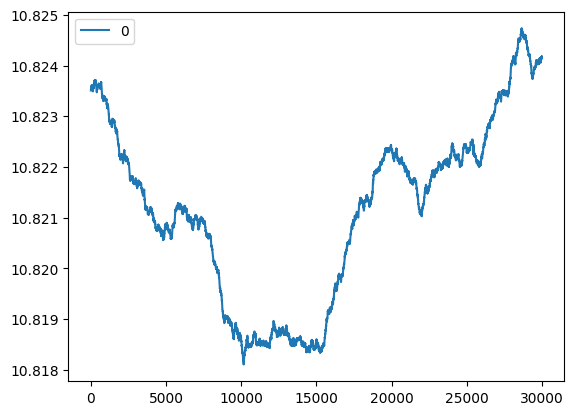

In [24]:
key, sub = jax.random.split(key)
xi = jft.random_like(sub, signal_response_tod.domain)
res = signal_response_tod(xi)
print(res.shape)

# for i in range(res.shape[0]):
# for i in range(0, n, n//10):
for i in [0]:
    plt.plot(np.arange(0, res.shape[1]), res[i], label=i)
plt.legend()
plt.show()

# MAP fit

In [25]:
n_it = 1
# delta = 1e-4 # default
# delta = 1e-8 # map
# tod
if noiselevel == 0.0: delta = 1e-4
elif noiselevel == 0.1: delta = 1e-10
elif noiselevel == 0.5: delta = 1e-10
elif noiselevel == 1.0: delta = 1e-4

n_samples = 0 # no samples -> maximum aposteriory posterior

key, k_i, k_o = random.split(key, 3)

samples, state = jft.optimize_kl(
    lh, # likelihood
    jft.Vector(lh.init(k_i)), # initial position in model space (initialisation)
    n_total_iterations=n_it, # no of optimisation steps (global)
    n_samples=n_samples, # draw samples
    key=k_o, # random jax init
    draw_linear_kwargs=dict( # sampling parameters
        cg_name="SL",
        cg_kwargs=dict(absdelta=delta * jft.size(lh.domain) / 10.0, maxiter=60),
    ),
    nonlinearly_update_kwargs=dict( # map from multivariate gaussian to more compl. distribution (coordinate transformations)
        minimize_kwargs=dict(
            name="SN",
            xtol=delta,
            cg_kwargs=dict(name=None),
            maxiter=5,
        )
    ),
    kl_kwargs=dict( # shift transformed multivar gauss to best match true posterior
        minimize_kwargs=dict(
            # name="M", xtol=delta, cg_kwargs=dict(name=None), maxiter=60 # map
            name="M", xtol=delta, cg_kwargs=dict(name=None), maxiter=20 # map
        )
    ),
    sample_mode="nonlinear_resample", # how steps are combined (samples + nonlin + KL)
)

OPTIMIZE_KL: Starting 0001
M: →:1.0 ↺:False #∇²:06 |↘|:2.094380e+02 ➽:1.040006e+02
M: Iteration 1 ⛰:+8.738354e+08 Δ⛰:3.406988e+10
M: →:1.0 ↺:False #∇²:12 |↘|:1.609743e+02 ➽:1.040006e+02
M: Iteration 2 ⛰:+3.401750e+08 Δ⛰:5.336604e+08
M: →:1.0 ↺:False #∇²:18 |↘|:8.807778e+01 ➽:1.040006e+02
M: Iteration 3 ⛰:+9.360167e+07 Δ⛰:2.465733e+08
OPTIMIZE_KL: Iteration 0001 ⛰:+9.3602e+07
OPTIMIZE_KL: #(KL minimization steps) 3
OPTIMIZE_KL: Likelihood residual(s):
'reduced χ²: 2.9e+01±     0.0, avg:    -0.12±     0.0, #dof:6510000'

OPTIMIZE_KL: Prior residual(s):
cfmapax1fluctuations    :: 'reduced χ²:    0.16±     0.0, avg:     -0.4±     0.0, #dof:      1'
cfmapax1loglogavgslope  :: 'reduced χ²:    0.31±     0.0, avg:    -0.55±     0.0, #dof:      1'
cfmapxi                 :: 'reduced χ²:     1.0±     0.0, avg: +0.00066±     0.0, #dof:1000000'
cfmapzeromode           :: 'reduced χ²:    0.17±     0.0, avg:    -0.41±     0.0, #dof:      1'
combcf tod fluctuations :: 'reduced χ²:    0.19±     0.0, a

In [26]:
samples.pos

Vector(
	{'cfmapax1fluctuations': Array(-0.4016681, dtype=float64),
	 'cfmapax1loglogavgslope': Array(-0.55277033, dtype=float64),
	 'cfmapxi': Array([[-1.03495819,  1.15443759,  0.88502777, ..., -1.01464576,
	         0.87349179, -1.68187141],
	       [-0.39739372,  2.10746299,  1.13960366, ..., -0.18948384,
	         0.1139031 ,  0.11320894],
	       [ 0.65082167,  1.01476278, -1.09977407, ...,  1.24435542,
	         0.51749963,  1.33761005],
	       ...,
	       [-1.60090557, -0.25498834, -1.48699575, ..., -0.63223599,
	         1.63085651, -1.20408592],
	       [ 1.21017004,  0.672686  , -0.80463505, ...,  0.55363686,
	         0.34549531,  1.35866285],
	       [-0.03043683,  0.42592871, -0.83902028, ...,  0.6082338 ,
	        -0.22144426, -0.42987537]], dtype=float64),
	 'cfmapzeromode': Array(-0.40884025, dtype=float64),
	 'combcf tod fluctuations': Array(-0.4355, dtype=float64),
	 'combcf tod loglogavgslope': Array(6.74426909, dtype=float64),
	 'combcf xi': Array([[  0.03522116,

In [27]:
def printfitresults():
    print("Fit Results (res, init, std)")

    print("\nTODs:")
    print(f"\tfluctuations: {jft.LogNormalPrior(*cf_fl_tod['fluctuations'])(samples.pos['combcf tod fluctuations'])}, {cf_fl_tod['fluctuations'][0]}, {cf_fl_tod['fluctuations'][1]}")
    print(f"\tloglogvarslope: {jft.NormalPrior(*cf_fl_tod['loglogavgslope'])(samples.pos['combcf tod loglogavgslope'])}, {cf_fl_tod['loglogavgslope'][0]}, {cf_fl_tod['loglogavgslope'][1]}")
    print(f"\tzeromode std (LogNormal): {jft.LogNormalPrior(*cf_zm_tod['offset_std'])(samples.pos['combcf zeromode'])}, {cf_zm_tod['offset_std'][0]}, {cf_zm_tod['offset_std'][1]}")
    
    print("map:")
    print(f"\tfluctuations: {jft.LogNormalPrior(*cf_fl_map['fluctuations'])(samples.pos['cfmapax1fluctuations'])}, {cf_fl_map['fluctuations'][0]}, {cf_fl_map['fluctuations'][1]}")
    print(f"\tloglogvarslope: {jft.NormalPrior(*cf_fl_map['loglogavgslope'])(samples.pos['cfmapax1loglogavgslope'])}, {cf_fl_map['loglogavgslope'][0]}, {cf_fl_map['loglogavgslope'][1]}")
    print(f"\tzeromode std (LogNormal): {jft.LogNormalPrior(*cf_zm_map['offset_std'])(samples.pos['cfmapzeromode'])}, {cf_zm_map['offset_std'][0]}, {cf_zm_map['offset_std'][1]}")
    
printfitresults()

Fit Results (res, init, std)

TODs:
	fluctuations: 0.0014538957217417766, 0.0015, 0.0001
	loglogvarslope: -1.7755730907251976, -2.45, 0.1
	zeromode std (LogNormal): 1.80247764420802e-06, 1e-05, 9.9e-06
map:
	fluctuations: 5.559093811048402e-05, 5.6e-05, 1e-06
	loglogvarslope: -2.5552770326296166, -2.5, 0.1
	zeromode std (LogNormal): 4.134247431031734e-10, 1e-08, 1e-07


(217, 30000)


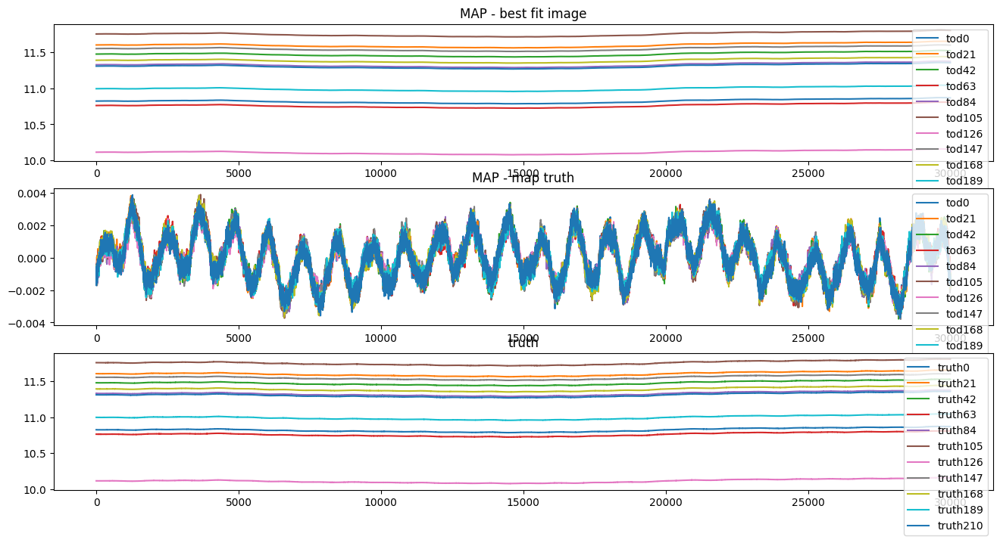

In [28]:
res = signal_response_tod(samples.pos)
print(res.shape)

fig, axes = plt.subplots(3, 1, figsize=(16, 8))

# for i in range(0, res.shape[0], res.shape[0]//10):
for i in range(0, n, n//10):
    im0 = axes[0].plot(np.arange(0, res.shape[1]), res[i], label=f"tod{i}")
    im1 = axes[1].plot(np.arange(0, res.shape[1]), res[i] - truth[i], label=f"tod{i}")
    im2 = axes[2].plot(truth[i], label=f"truth{i}")

axes[0].title.set_text('MAP - best fit image')
axes[0].legend()
axes[1].title.set_text('MAP - map truth')
axes[1].legend()
axes[2].title.set_text('truth')
axes[2].legend()

plt.show()

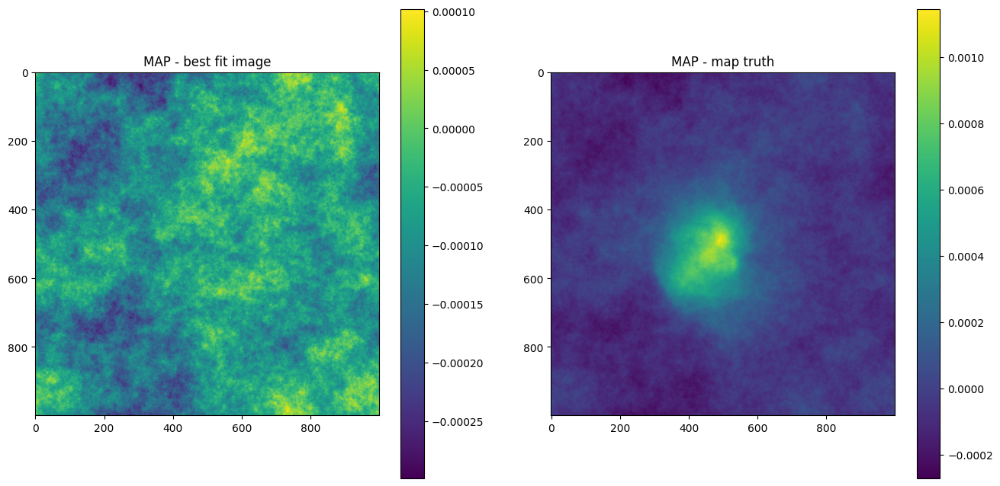

In [29]:
# plot maximum of posterior (mode)
# sig_map = gp_map(samples.pos)[padding_map//2:-padding_map//2, padding_map//2:-padding_map//2] # when splitting up in different field models
sig_map = gp_map(samples.pos)

fig, axes = plt.subplots(1, 2, figsize=(16, 8))

im0 = axes[0].imshow(sig_map)
axes[0].title.set_text('MAP - best fit image')
fig.colorbar(im0)

im1 = axes[1].imshow( sig_map - mapdata_truth[0, 0] )
axes[1].title.set_text('MAP - map truth')
# im1 = axes[1].imshow( (sig_map - mapdata_truth) )
# axes[1].title.set_text('diff prediction - map truth')
fig.colorbar(im1)

plt.show()

In [30]:
# assert False

## Full nifty fit:

OPTIMIZE_KL: Starting 0001
SL: Iteration 0 ⛰:+1.9262e+08 Δ⛰:inf ➽:1.0400e+01
SL: Iteration 1 ⛰:+1.9956e+07 Δ⛰:1.7266e+08 ➽:1.0400e+01
SL: Iteration 2 ⛰:+1.2029e+07 Δ⛰:7.9270e+06 ➽:1.0400e+01
SL: Iteration 3 ⛰:+5.1431e+06 Δ⛰:6.8861e+06 ➽:1.0400e+01
SL: Iteration 4 ⛰:+2.9974e+06 Δ⛰:2.1457e+06 ➽:1.0400e+01
SL: Iteration 5 ⛰:+2.2930e+06 Δ⛰:7.0436e+05 ➽:1.0400e+01
SL: Iteration 6 ⛰:+1.0676e+06 Δ⛰:1.2254e+06 ➽:1.0400e+01
SL: Iteration 7 ⛰:+5.6991e+05 Δ⛰:4.9767e+05 ➽:1.0400e+01
SL: Iteration 8 ⛰:+3.3117e+05 Δ⛰:2.3873e+05 ➽:1.0400e+01
SL: Iteration 9 ⛰:+1.7952e+05 Δ⛰:1.5165e+05 ➽:1.0400e+01
SL: Iteration 10 ⛰:+2.1860e+04 Δ⛰:1.5766e+05 ➽:1.0400e+01
SL: Iteration 11 ⛰:+7.9994e+03 Δ⛰:1.3861e+04 ➽:1.0400e+01
SL: Iteration 12 ⛰:-8.2722e+04 Δ⛰:9.0722e+04 ➽:1.0400e+01
SL: Iteration 13 ⛰:-1.6188e+05 Δ⛰:7.9156e+04 ➽:1.0400e+01
SL: Iteration 14 ⛰:-1.6433e+05 Δ⛰:2.4489e+03 ➽:1.0400e+01
SL: Iteration 15 ⛰:-1.9993e+05 Δ⛰:3.5599e+04 ➽:1.0400e+01
SL: Iteration 16 ⛰:-2.6562e+05 Δ⛰:6.5695e+04 ➽:1.0400e+01
SL: 

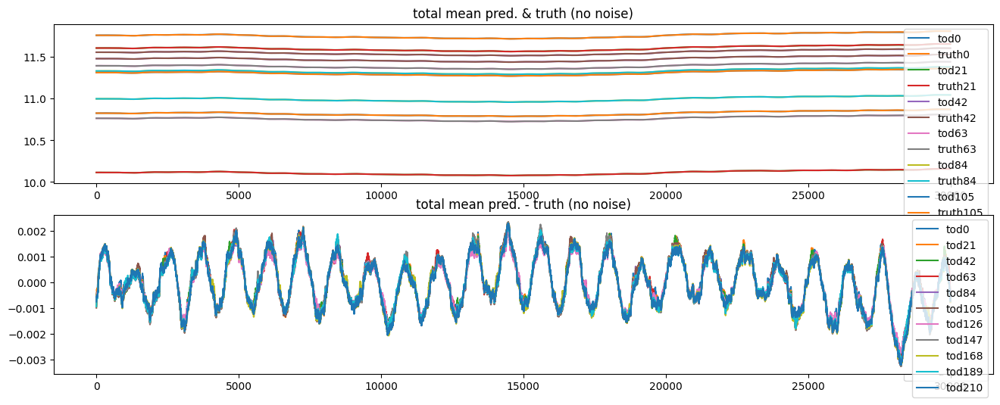

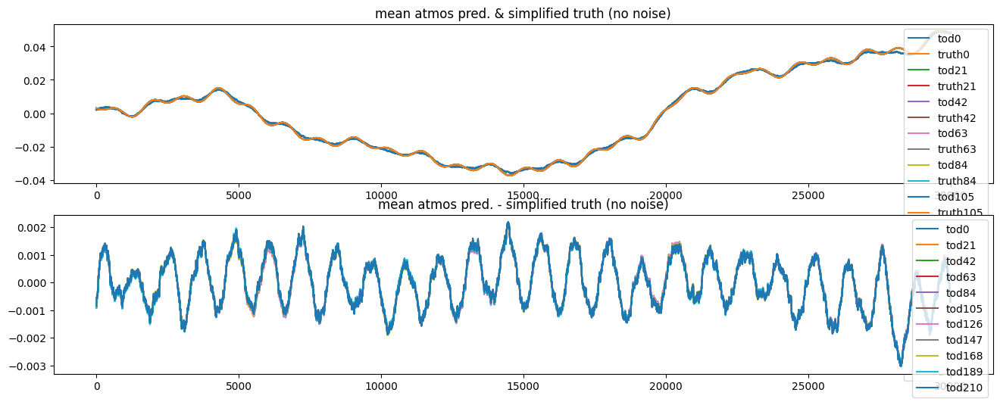

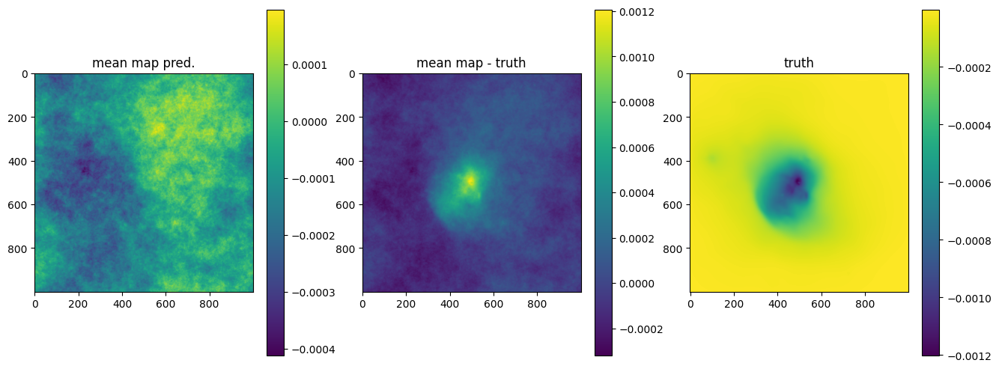

OPTIMIZE_KL: Starting 0003
SL: Iteration 0 ⛰:+1.4843e+08 Δ⛰:inf ➽:1.0400e+01
SL: Iteration 1 ⛰:+3.5500e+07 Δ⛰:1.1292e+08 ➽:1.0400e+01
SL: Iteration 2 ⛰:+2.1191e+07 Δ⛰:1.4310e+07 ➽:1.0400e+01
SL: Iteration 3 ⛰:+8.8300e+06 Δ⛰:1.2361e+07 ➽:1.0400e+01
SL: Iteration 4 ⛰:+6.5469e+06 Δ⛰:2.2831e+06 ➽:1.0400e+01
SL: Iteration 5 ⛰:+5.2753e+06 Δ⛰:1.2716e+06 ➽:1.0400e+01
SL: Iteration 6 ⛰:+4.0759e+06 Δ⛰:1.1994e+06 ➽:1.0400e+01
SL: Iteration 7 ⛰:+2.9907e+06 Δ⛰:1.0852e+06 ➽:1.0400e+01
SL: Iteration 8 ⛰:+2.2318e+06 Δ⛰:7.5899e+05 ➽:1.0400e+01
SL: Iteration 9 ⛰:+1.8641e+06 Δ⛰:3.6765e+05 ➽:1.0400e+01
SL: Iteration 10 ⛰:+1.8462e+06 Δ⛰:1.7880e+04 ➽:1.0400e+01
SL: Iteration 11 ⛰:+1.6430e+06 Δ⛰:2.0327e+05 ➽:1.0400e+01
SL: Iteration 12 ⛰:+1.3468e+06 Δ⛰:2.9621e+05 ➽:1.0400e+01
SL: Iteration 13 ⛰:+1.0195e+06 Δ⛰:3.2722e+05 ➽:1.0400e+01
SL: Iteration 14 ⛰:+8.1104e+05 Δ⛰:2.0849e+05 ➽:1.0400e+01
SL: Iteration 15 ⛰:+7.7400e+05 Δ⛰:3.7045e+04 ➽:1.0400e+01
SL: Iteration 16 ⛰:+7.0500e+05 Δ⛰:6.9001e+04 ➽:1.0400e+01
SL: 

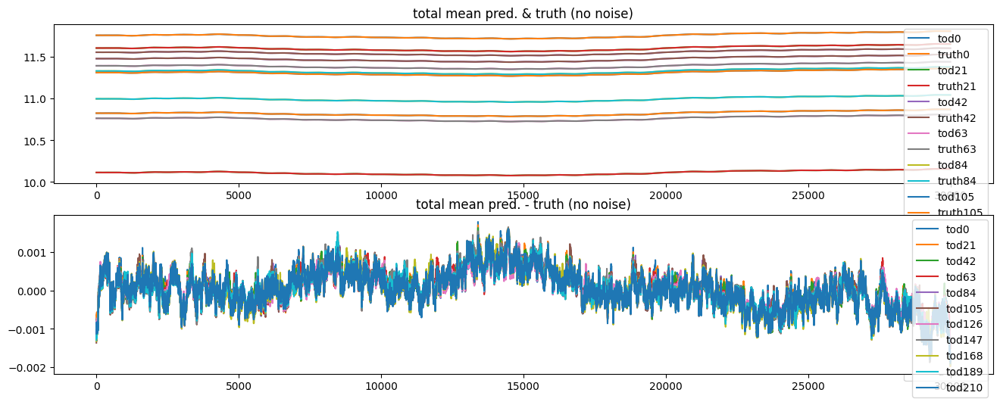

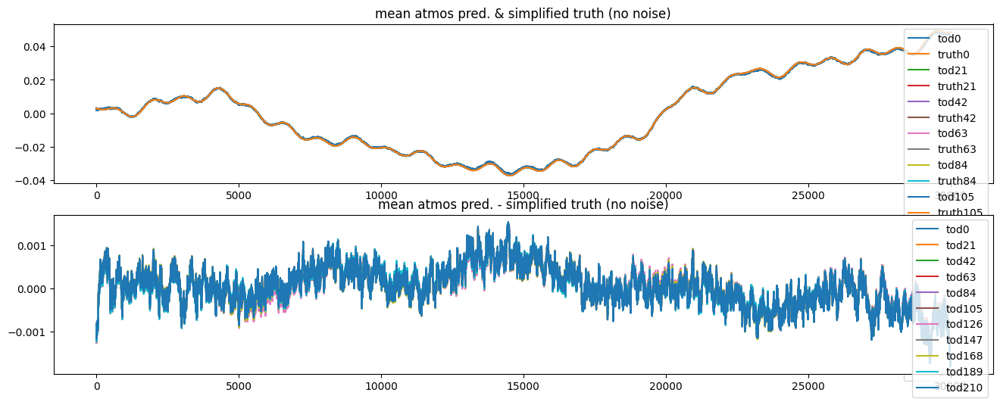

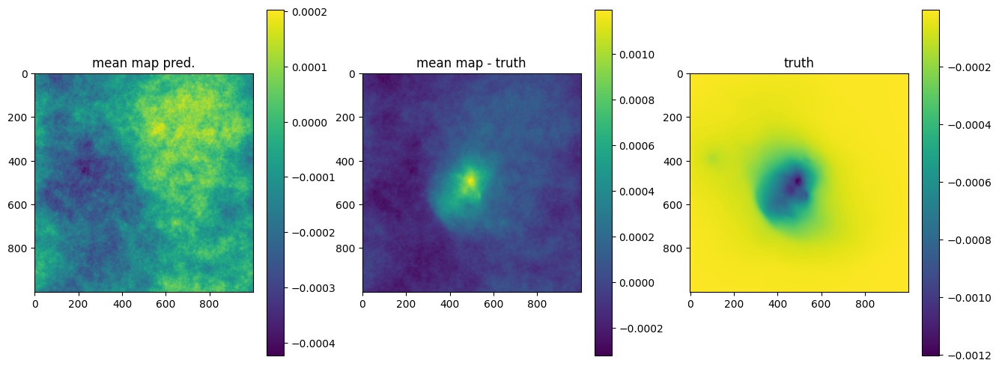

OPTIMIZE_KL: Starting 0005
SL: Iteration 0 ⛰:+1.2239e+08 Δ⛰:inf ➽:1.0400e+01
SL: Iteration 1 ⛰:+4.3746e+07 Δ⛰:7.8641e+07 ➽:1.0400e+01
SL: Iteration 2 ⛰:+3.1194e+07 Δ⛰:1.2552e+07 ➽:1.0400e+01
SL: Iteration 3 ⛰:+1.8078e+07 Δ⛰:1.3116e+07 ➽:1.0400e+01
SL: Iteration 4 ⛰:+1.3987e+07 Δ⛰:4.0907e+06 ➽:1.0400e+01
SL: Iteration 5 ⛰:+1.0618e+07 Δ⛰:3.3692e+06 ➽:1.0400e+01
SL: Iteration 6 ⛰:+8.0074e+06 Δ⛰:2.6106e+06 ➽:1.0400e+01
SL: Iteration 7 ⛰:+6.0223e+06 Δ⛰:1.9851e+06 ➽:1.0400e+01
SL: Iteration 8 ⛰:+4.8679e+06 Δ⛰:1.1544e+06 ➽:1.0400e+01
SL: Iteration 9 ⛰:+4.0121e+06 Δ⛰:8.5584e+05 ➽:1.0400e+01
SL: Iteration 10 ⛰:+3.9882e+06 Δ⛰:2.3914e+04 ➽:1.0400e+01
SL: Iteration 11 ⛰:+3.5620e+06 Δ⛰:4.2615e+05 ➽:1.0400e+01
SL: Iteration 12 ⛰:+3.0162e+06 Δ⛰:5.4578e+05 ➽:1.0400e+01
SL: Iteration 13 ⛰:+2.5102e+06 Δ⛰:5.0599e+05 ➽:1.0400e+01
SL: Iteration 14 ⛰:+2.1994e+06 Δ⛰:3.1080e+05 ➽:1.0400e+01
SL: Iteration 15 ⛰:+1.9025e+06 Δ⛰:2.9695e+05 ➽:1.0400e+01
SL: Iteration 16 ⛰:+1.8887e+06 Δ⛰:1.3809e+04 ➽:1.0400e+01
SL: 

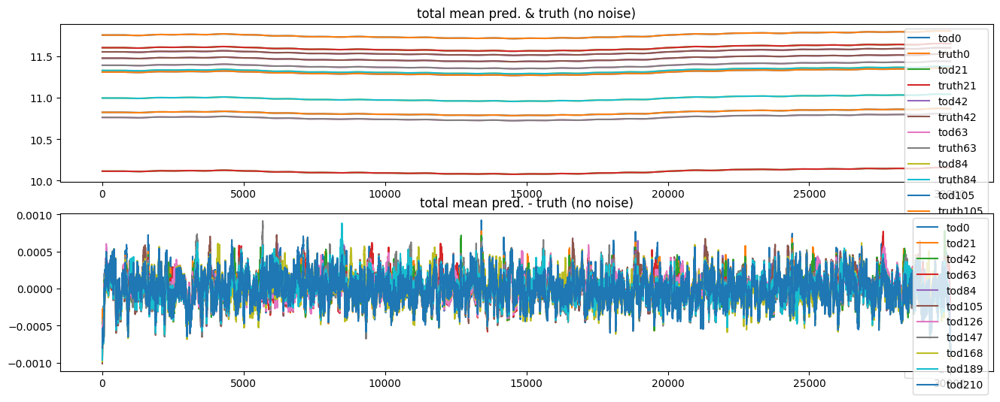

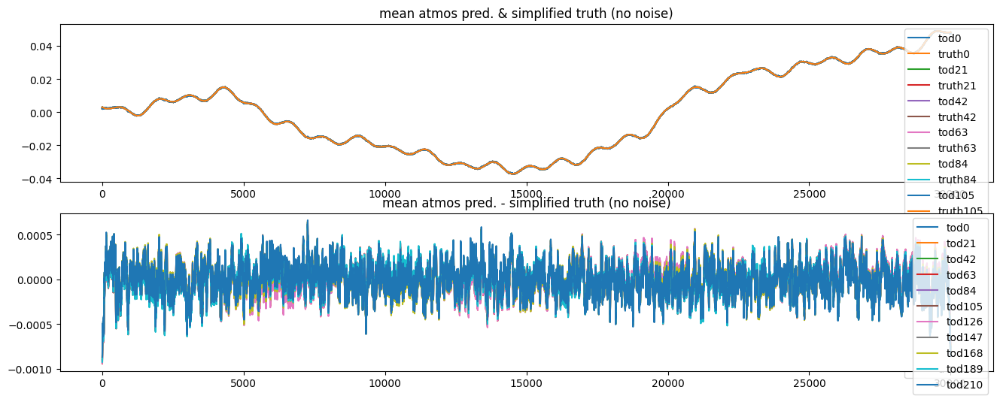

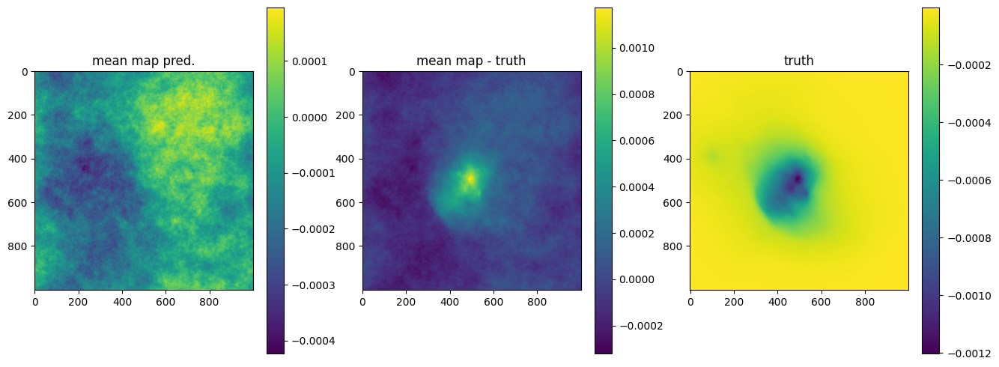

OPTIMIZE_KL: Starting 0007
SL: Iteration 0 ⛰:+2.4367e+08 Δ⛰:inf ➽:1.0400e+01
SL: Iteration 1 ⛰:+1.1862e+08 Δ⛰:1.2505e+08 ➽:1.0400e+01
SL: Iteration 2 ⛰:+4.4054e+07 Δ⛰:7.4567e+07 ➽:1.0400e+01
SL: Iteration 3 ⛰:+2.1199e+07 Δ⛰:2.2855e+07 ➽:1.0400e+01
SL: Iteration 4 ⛰:+1.3554e+07 Δ⛰:7.6452e+06 ➽:1.0400e+01
SL: Iteration 5 ⛰:+7.8719e+06 Δ⛰:5.6818e+06 ➽:1.0400e+01
SL: Iteration 6 ⛰:+5.4938e+06 Δ⛰:2.3781e+06 ➽:1.0400e+01
SL: Iteration 7 ⛰:+4.7505e+06 Δ⛰:7.4331e+05 ➽:1.0400e+01
SL: Iteration 8 ⛰:+3.6292e+06 Δ⛰:1.1213e+06 ➽:1.0400e+01
SL: Iteration 9 ⛰:+3.0039e+06 Δ⛰:6.2521e+05 ➽:1.0400e+01
SL: Iteration 10 ⛰:+2.9981e+06 Δ⛰:5.7990e+03 ➽:1.0400e+01
SL: Iteration 11 ⛰:+2.7788e+06 Δ⛰:2.1935e+05 ➽:1.0400e+01
SL: Iteration 12 ⛰:+2.4305e+06 Δ⛰:3.4826e+05 ➽:1.0400e+01
SL: Iteration 13 ⛰:+2.1199e+06 Δ⛰:3.1064e+05 ➽:1.0400e+01
SL: Iteration 14 ⛰:+1.8277e+06 Δ⛰:2.9215e+05 ➽:1.0400e+01
SL: Iteration 15 ⛰:+1.6895e+06 Δ⛰:1.3828e+05 ➽:1.0400e+01
SL: Iteration 16 ⛰:+1.4780e+06 Δ⛰:2.1152e+05 ➽:1.0400e+01
SL: 

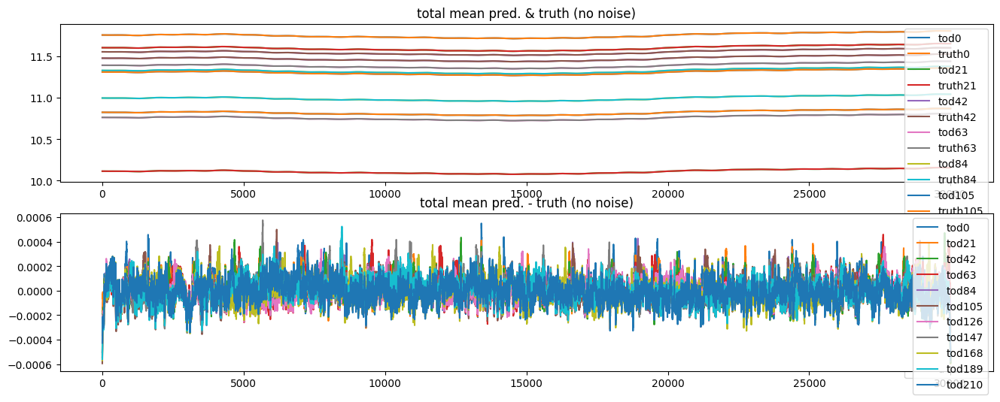

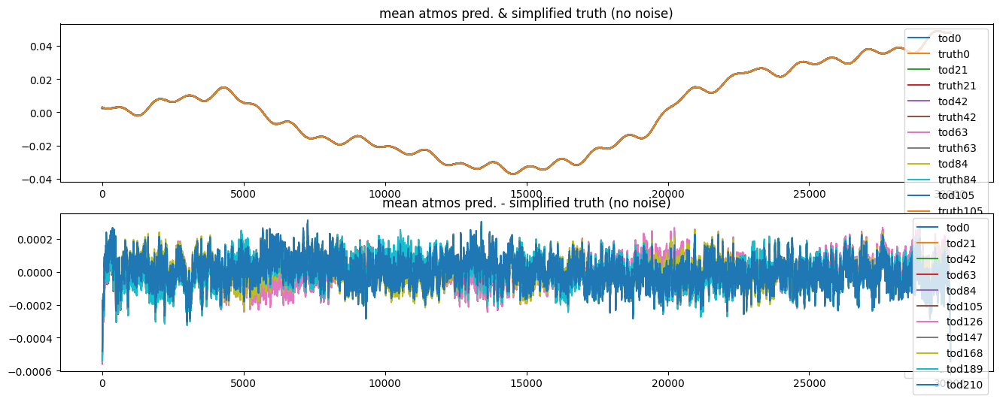

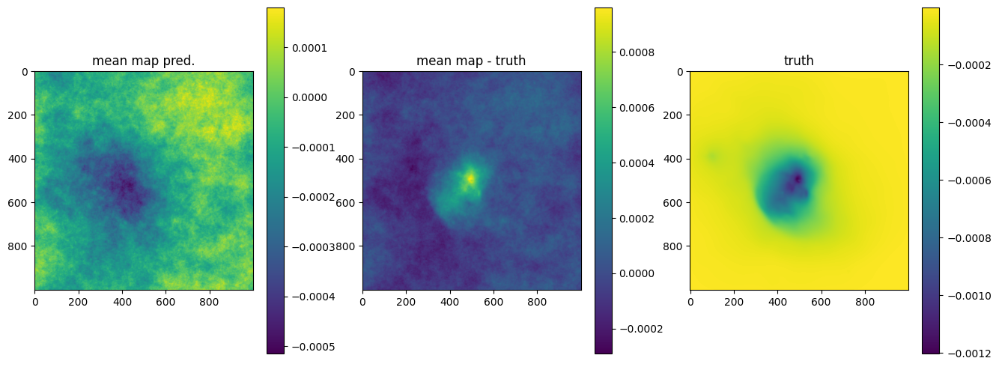

OPTIMIZE_KL: Starting 0009
SL: Iteration 0 ⛰:+9.0332e+07 Δ⛰:inf ➽:1.0400e+01
SL: Iteration 1 ⛰:+4.4980e+07 Δ⛰:4.5352e+07 ➽:1.0400e+01
SL: Iteration 2 ⛰:+2.5906e+07 Δ⛰:1.9074e+07 ➽:1.0400e+01
SL: Iteration 3 ⛰:+1.0601e+07 Δ⛰:1.5305e+07 ➽:1.0400e+01
SL: Iteration 4 ⛰:+7.8293e+06 Δ⛰:2.7720e+06 ➽:1.0400e+01
SL: Iteration 5 ⛰:+4.2021e+06 Δ⛰:3.6272e+06 ➽:1.0400e+01
SL: Iteration 6 ⛰:+3.1997e+06 Δ⛰:1.0024e+06 ➽:1.0400e+01
SL: Iteration 7 ⛰:+2.4011e+06 Δ⛰:7.9861e+05 ➽:1.0400e+01
SL: Iteration 8 ⛰:+1.9351e+06 Δ⛰:4.6601e+05 ➽:1.0400e+01
SL: Iteration 9 ⛰:+1.4101e+06 Δ⛰:5.2498e+05 ➽:1.0400e+01
SL: Iteration 10 ⛰:+1.3905e+06 Δ⛰:1.9551e+04 ➽:1.0400e+01
SL: Iteration 11 ⛰:+1.2261e+06 Δ⛰:1.6443e+05 ➽:1.0400e+01
SL: Iteration 12 ⛰:+1.0081e+06 Δ⛰:2.1804e+05 ➽:1.0400e+01
SL: Iteration 13 ⛰:+8.1134e+05 Δ⛰:1.9672e+05 ➽:1.0400e+01
SL: Iteration 14 ⛰:+6.1570e+05 Δ⛰:1.9564e+05 ➽:1.0400e+01
SL: Iteration 15 ⛰:+6.0844e+05 Δ⛰:7.2596e+03 ➽:1.0400e+01
SL: Iteration 16 ⛰:+4.8007e+05 Δ⛰:1.2838e+05 ➽:1.0400e+01
SL: 

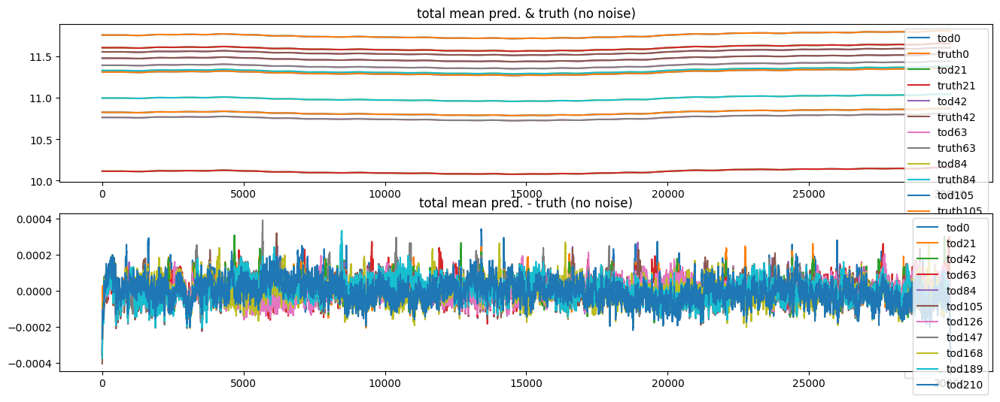

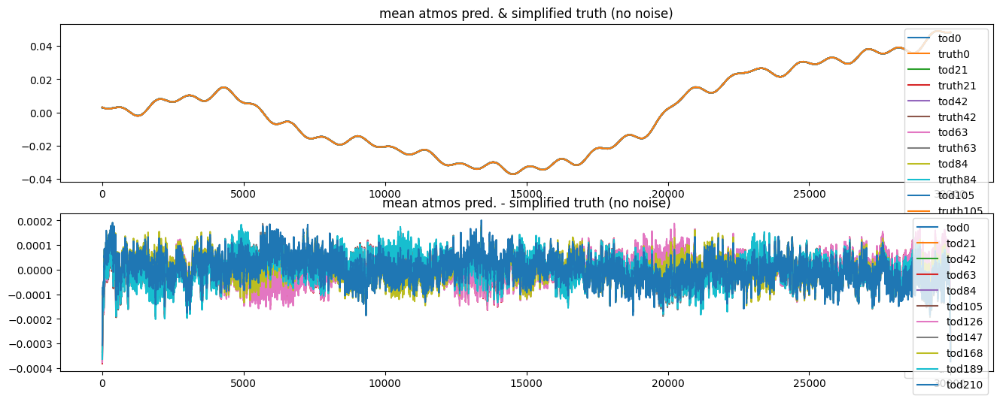

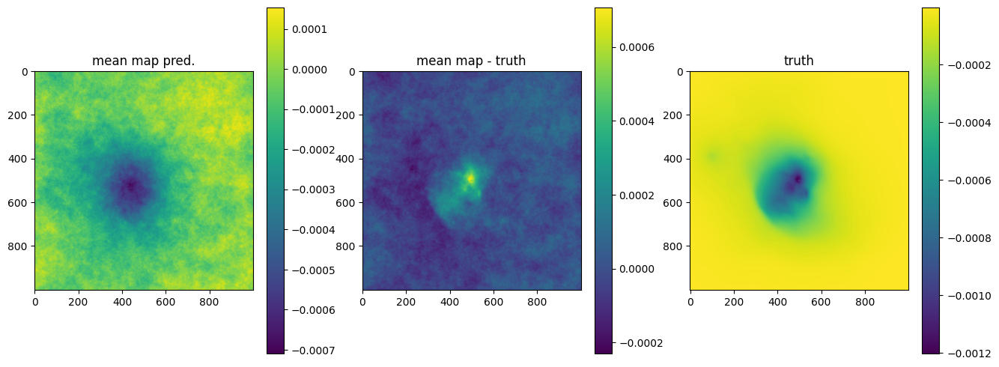

OPTIMIZE_KL: Starting 0011
SL: Iteration 0 ⛰:+1.7668e+08 Δ⛰:inf ➽:1.0400e+01
SL: Iteration 1 ⛰:+9.0177e+07 Δ⛰:8.6505e+07 ➽:1.0400e+01
SL: Iteration 2 ⛰:+1.1392e+07 Δ⛰:7.8785e+07 ➽:1.0400e+01
SL: Iteration 3 ⛰:+5.8806e+06 Δ⛰:5.5116e+06 ➽:1.0400e+01
SL: Iteration 4 ⛰:+3.8052e+06 Δ⛰:2.0753e+06 ➽:1.0400e+01
SL: Iteration 5 ⛰:+2.3299e+06 Δ⛰:1.4753e+06 ➽:1.0400e+01
SL: Iteration 6 ⛰:+1.6546e+06 Δ⛰:6.7535e+05 ➽:1.0400e+01
SL: Iteration 7 ⛰:+1.3134e+06 Δ⛰:3.4121e+05 ➽:1.0400e+01
SL: Iteration 8 ⛰:+8.4631e+05 Δ⛰:4.6704e+05 ➽:1.0400e+01
SL: Iteration 9 ⛰:+6.2418e+05 Δ⛰:2.2212e+05 ➽:1.0400e+01
SL: Iteration 10 ⛰:+5.9078e+05 Δ⛰:3.3402e+04 ➽:1.0400e+01
SL: Iteration 11 ⛰:+4.7062e+05 Δ⛰:1.2017e+05 ➽:1.0400e+01
SL: Iteration 12 ⛰:+3.9450e+05 Δ⛰:7.6113e+04 ➽:1.0400e+01
SL: Iteration 13 ⛰:+2.7488e+05 Δ⛰:1.1963e+05 ➽:1.0400e+01
SL: Iteration 14 ⛰:+2.5857e+05 Δ⛰:1.6311e+04 ➽:1.0400e+01
SL: Iteration 15 ⛰:+1.6332e+05 Δ⛰:9.5243e+04 ➽:1.0400e+01
SL: Iteration 16 ⛰:+8.8116e+04 Δ⛰:7.5207e+04 ➽:1.0400e+01
SL: 

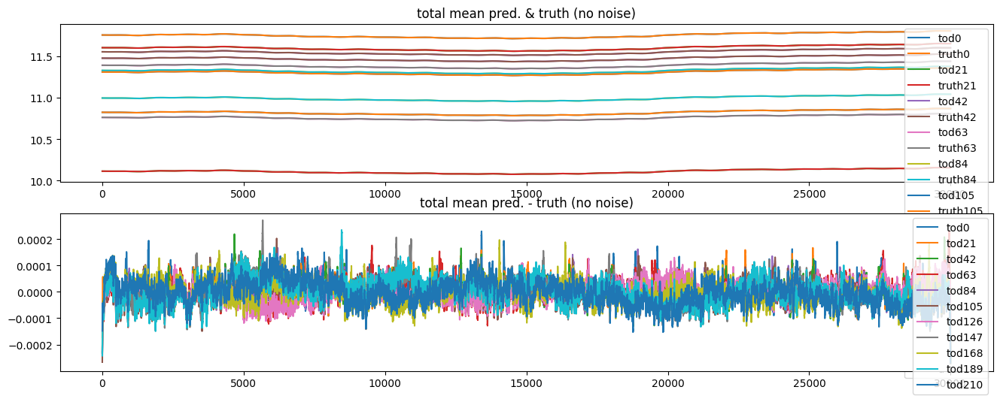

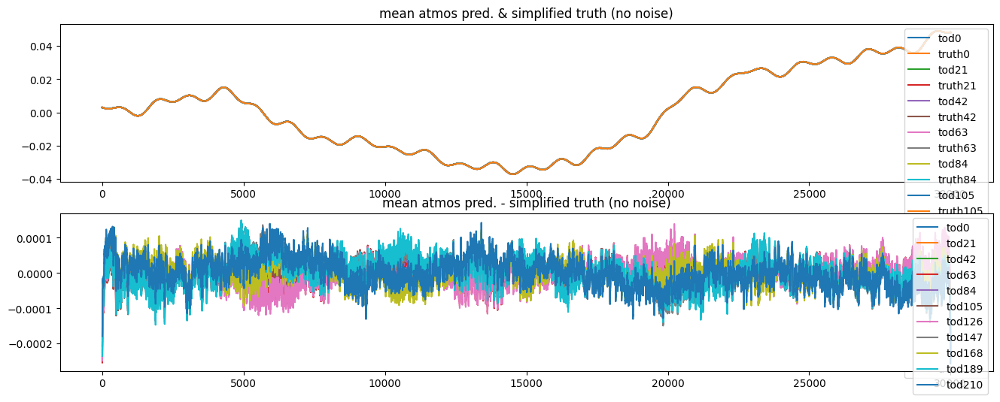

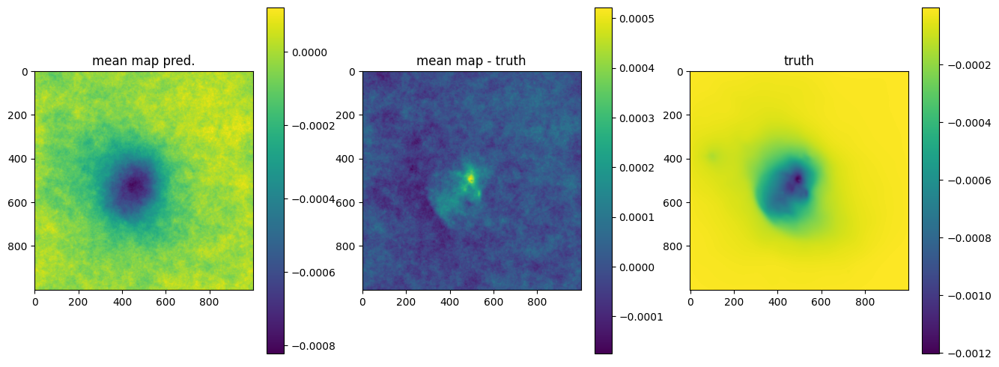

OPTIMIZE_KL: Starting 0013
SL: Iteration 0 ⛰:+7.0379e+07 Δ⛰:inf ➽:1.0400e+01
SL: Iteration 1 ⛰:+4.3577e+07 Δ⛰:2.6801e+07 ➽:1.0400e+01
SL: Iteration 2 ⛰:+2.6356e+07 Δ⛰:1.7221e+07 ➽:1.0400e+01
SL: Iteration 3 ⛰:+9.5032e+06 Δ⛰:1.6853e+07 ➽:1.0400e+01
SL: Iteration 4 ⛰:+6.6627e+06 Δ⛰:2.8405e+06 ➽:1.0400e+01
SL: Iteration 5 ⛰:+2.8514e+06 Δ⛰:3.8113e+06 ➽:1.0400e+01
SL: Iteration 6 ⛰:+1.8739e+06 Δ⛰:9.7750e+05 ➽:1.0400e+01
SL: Iteration 7 ⛰:+1.0545e+06 Δ⛰:8.1944e+05 ➽:1.0400e+01
SL: Iteration 8 ⛰:+5.5444e+05 Δ⛰:5.0006e+05 ➽:1.0400e+01
SL: Iteration 9 ⛰:+3.4366e+05 Δ⛰:2.1078e+05 ➽:1.0400e+01
SL: Iteration 10 ⛰:+2.7410e+05 Δ⛰:6.9566e+04 ➽:1.0400e+01
SL: Iteration 11 ⛰:+1.3161e+05 Δ⛰:1.4249e+05 ➽:1.0400e+01
SL: Iteration 12 ⛰:+8.1244e+04 Δ⛰:5.0368e+04 ➽:1.0400e+01
SL: Iteration 13 ⛰:-2.1667e+04 Δ⛰:1.0291e+05 ➽:1.0400e+01
SL: Iteration 14 ⛰:-3.4395e+04 Δ⛰:1.2727e+04 ➽:1.0400e+01
SL: Iteration 15 ⛰:-1.1611e+05 Δ⛰:8.1719e+04 ➽:1.0400e+01
SL: Iteration 16 ⛰:-1.7866e+05 Δ⛰:6.2547e+04 ➽:1.0400e+01
SL: 

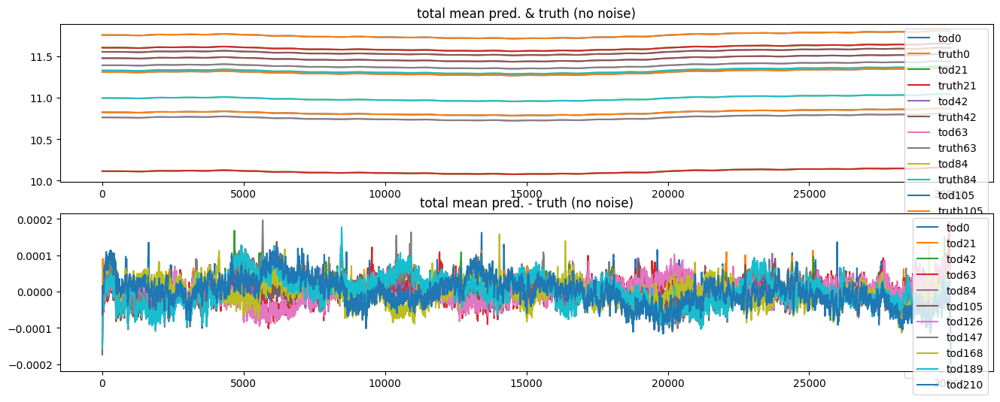

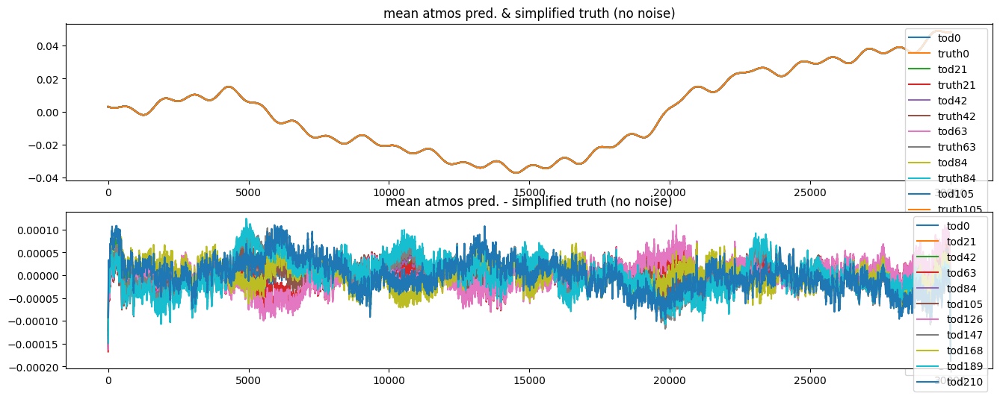

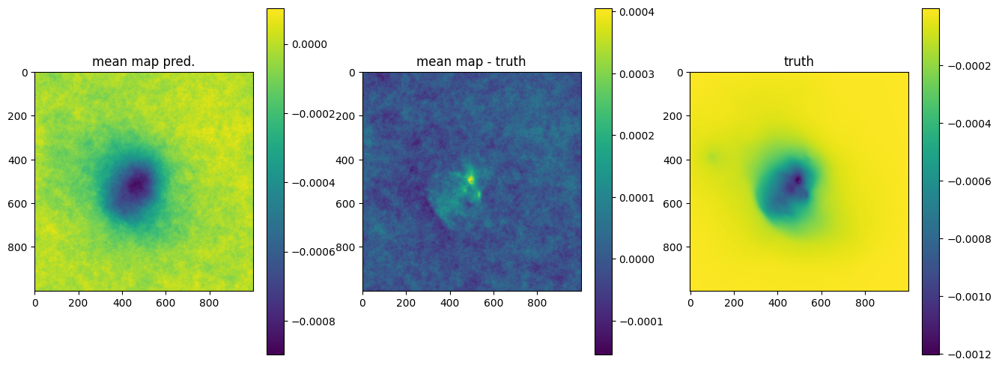

OPTIMIZE_KL: Starting 0015
SL: Iteration 0 ⛰:+6.1085e+07 Δ⛰:inf ➽:1.0400e+01
SL: Iteration 1 ⛰:+1.6909e+07 Δ⛰:4.4177e+07 ➽:1.0400e+01
SL: Iteration 2 ⛰:+1.0277e+07 Δ⛰:6.6317e+06 ➽:1.0400e+01
SL: Iteration 3 ⛰:+5.3258e+06 Δ⛰:4.9511e+06 ➽:1.0400e+01
SL: Iteration 4 ⛰:+3.9758e+06 Δ⛰:1.3500e+06 ➽:1.0400e+01
SL: Iteration 5 ⛰:+1.3118e+06 Δ⛰:2.6640e+06 ➽:1.0400e+01
SL: Iteration 6 ⛰:+7.6981e+05 Δ⛰:5.4200e+05 ➽:1.0400e+01
SL: Iteration 7 ⛰:+5.7746e+05 Δ⛰:1.9235e+05 ➽:1.0400e+01
SL: Iteration 8 ⛰:+2.5692e+05 Δ⛰:3.2054e+05 ➽:1.0400e+01
SL: Iteration 9 ⛰:+2.5383e+05 Δ⛰:3.0938e+03 ➽:1.0400e+01
SL: Iteration 10 ⛰:+1.3816e+05 Δ⛰:1.1566e+05 ➽:1.0400e+01
SL: Iteration 11 ⛰:+5.5839e+04 Δ⛰:8.2324e+04 ➽:1.0400e+01
SL: Iteration 12 ⛰:-7.2681e+04 Δ⛰:1.2852e+05 ➽:1.0400e+01
SL: Iteration 13 ⛰:-1.7278e+05 Δ⛰:1.0010e+05 ➽:1.0400e+01
SL: Iteration 14 ⛰:-1.7581e+05 Δ⛰:3.0216e+03 ➽:1.0400e+01
SL: Iteration 15 ⛰:-2.4273e+05 Δ⛰:6.6925e+04 ➽:1.0400e+01
SL: Iteration 16 ⛰:-2.4665e+05 Δ⛰:3.9158e+03 ➽:1.0400e+01
SL: 

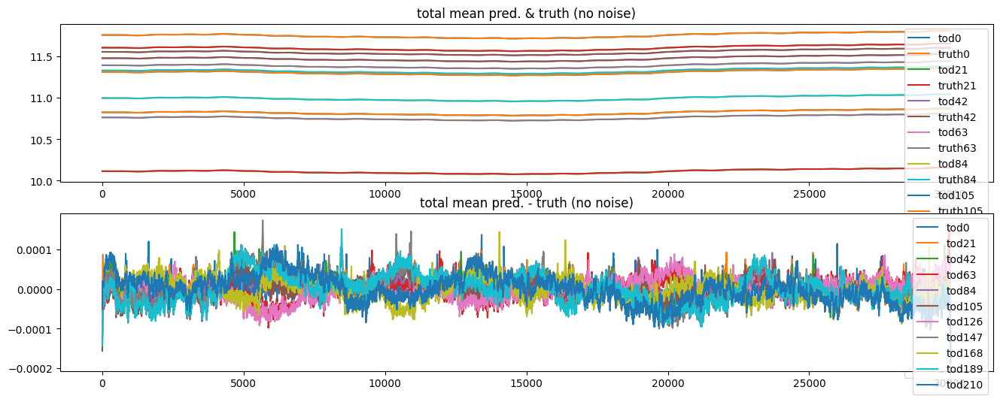

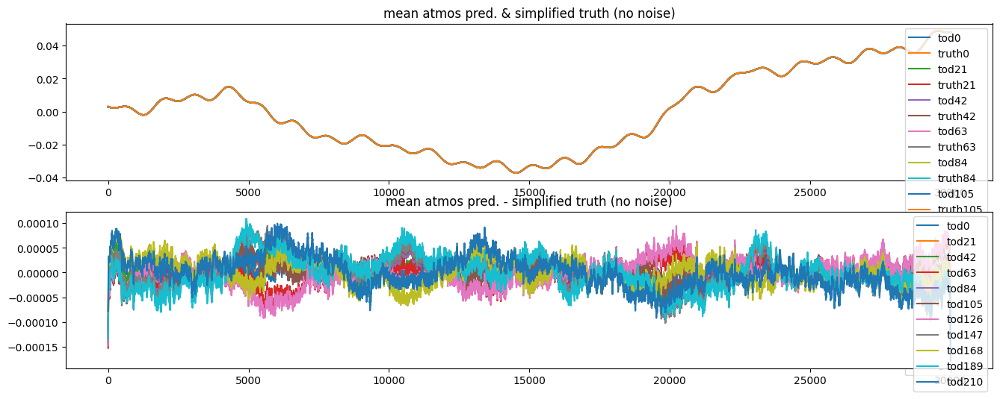

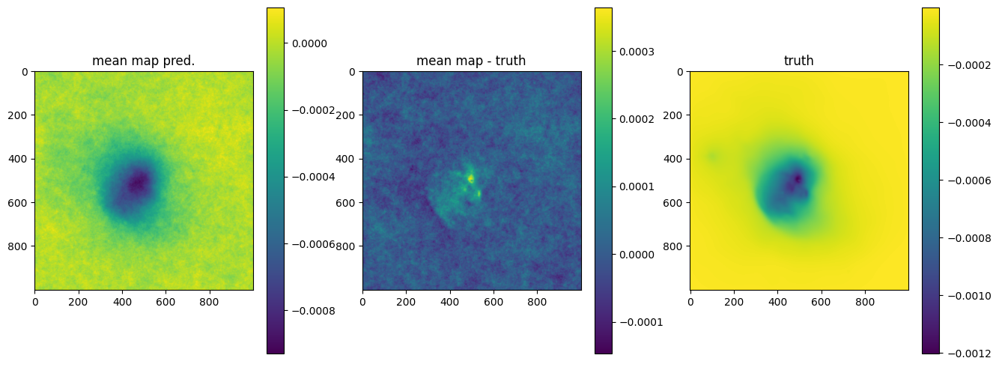

OPTIMIZE_KL: Starting 0017
SL: Iteration 0 ⛰:+5.5073e+08 Δ⛰:inf ➽:1.0400e+01
SL: Iteration 1 ⛰:+8.3885e+06 Δ⛰:5.4234e+08 ➽:1.0400e+01
SL: Iteration 2 ⛰:+5.6710e+06 Δ⛰:2.7175e+06 ➽:1.0400e+01
SL: Iteration 3 ⛰:+2.7491e+06 Δ⛰:2.9220e+06 ➽:1.0400e+01
SL: Iteration 4 ⛰:+1.6148e+06 Δ⛰:1.1343e+06 ➽:1.0400e+01
SL: Iteration 5 ⛰:+8.5841e+05 Δ⛰:7.5636e+05 ➽:1.0400e+01
SL: Iteration 6 ⛰:+6.2303e+05 Δ⛰:2.3538e+05 ➽:1.0400e+01
SL: Iteration 7 ⛰:+1.5170e+05 Δ⛰:4.7132e+05 ➽:1.0400e+01
SL: Iteration 8 ⛰:-2.0613e+04 Δ⛰:1.7232e+05 ➽:1.0400e+01
SL: Iteration 9 ⛰:-2.1507e+04 Δ⛰:8.9377e+02 ➽:1.0400e+01
SL: Iteration 10 ⛰:-8.9820e+04 Δ⛰:6.8313e+04 ➽:1.0400e+01
SL: Iteration 11 ⛰:-1.5267e+05 Δ⛰:6.2845e+04 ➽:1.0400e+01
SL: Iteration 12 ⛰:-2.5262e+05 Δ⛰:9.9951e+04 ➽:1.0400e+01
SL: Iteration 13 ⛰:-2.6648e+05 Δ⛰:1.3867e+04 ➽:1.0400e+01
SL: Iteration 14 ⛰:-3.0904e+05 Δ⛰:4.2556e+04 ➽:1.0400e+01
SL: Iteration 15 ⛰:-3.5846e+05 Δ⛰:4.9424e+04 ➽:1.0400e+01
SL: Iteration 16 ⛰:-3.5907e+05 Δ⛰:6.0860e+02 ➽:1.0400e+01
SL: 

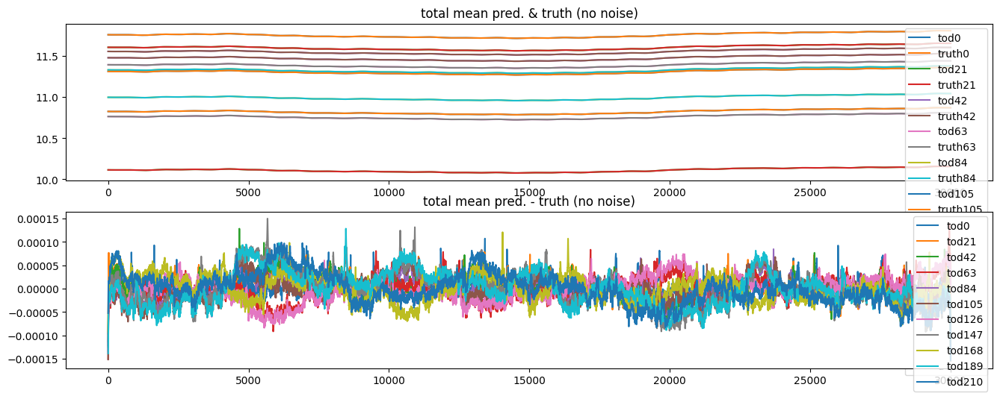

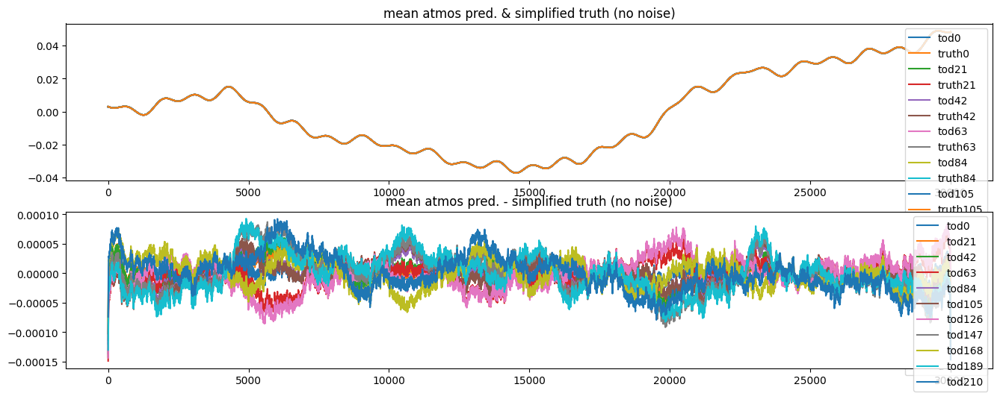

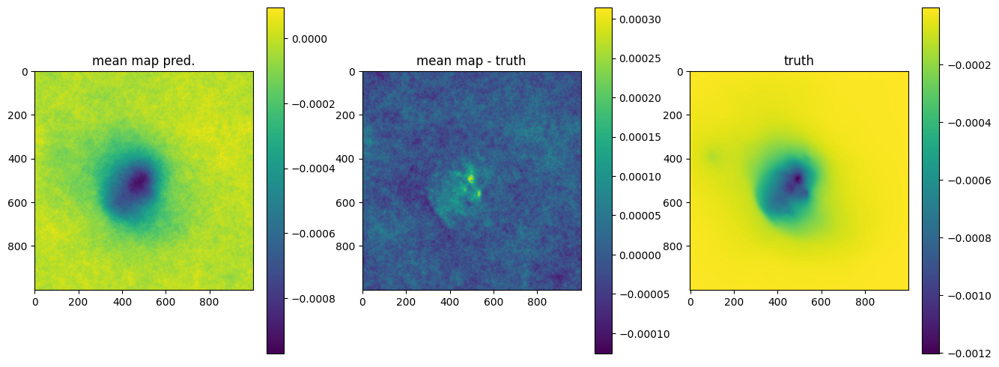

OPTIMIZE_KL: Starting 0019
SL: Iteration 0 ⛰:+2.1186e+07 Δ⛰:inf ➽:1.0400e+01
SL: Iteration 1 ⛰:+6.6066e+06 Δ⛰:1.4579e+07 ➽:1.0400e+01
SL: Iteration 2 ⛰:+4.8853e+06 Δ⛰:1.7212e+06 ➽:1.0400e+01
SL: Iteration 3 ⛰:+1.5093e+06 Δ⛰:3.3761e+06 ➽:1.0400e+01
SL: Iteration 4 ⛰:+1.3590e+06 Δ⛰:1.5031e+05 ➽:1.0400e+01
SL: Iteration 5 ⛰:+9.9715e+05 Δ⛰:3.6182e+05 ➽:1.0400e+01
SL: Iteration 6 ⛰:+1.2337e+05 Δ⛰:8.7378e+05 ➽:1.0400e+01
SL: Iteration 7 ⛰:-5.0304e+04 Δ⛰:1.7367e+05 ➽:1.0400e+01
SL: Iteration 8 ⛰:-1.2836e+05 Δ⛰:7.8051e+04 ➽:1.0400e+01
SL: Iteration 9 ⛰:-1.3026e+05 Δ⛰:1.9005e+03 ➽:1.0400e+01
SL: Iteration 10 ⛰:-2.5324e+05 Δ⛰:1.2298e+05 ➽:1.0400e+01
SL: Iteration 11 ⛰:-2.9229e+05 Δ⛰:3.9055e+04 ➽:1.0400e+01
SL: Iteration 12 ⛰:-3.3572e+05 Δ⛰:4.3431e+04 ➽:1.0400e+01
SL: Iteration 13 ⛰:-3.5504e+05 Δ⛰:1.9317e+04 ➽:1.0400e+01
SL: Iteration 14 ⛰:-3.9202e+05 Δ⛰:3.6976e+04 ➽:1.0400e+01
SL: Iteration 15 ⛰:-3.9272e+05 Δ⛰:7.0421e+02 ➽:1.0400e+01
SL: Iteration 16 ⛰:-3.9437e+05 Δ⛰:1.6529e+03 ➽:1.0400e+01
SL: 

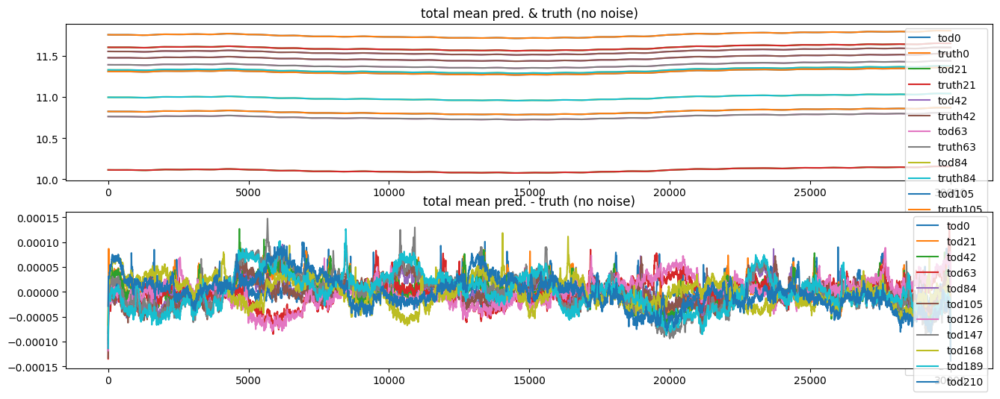

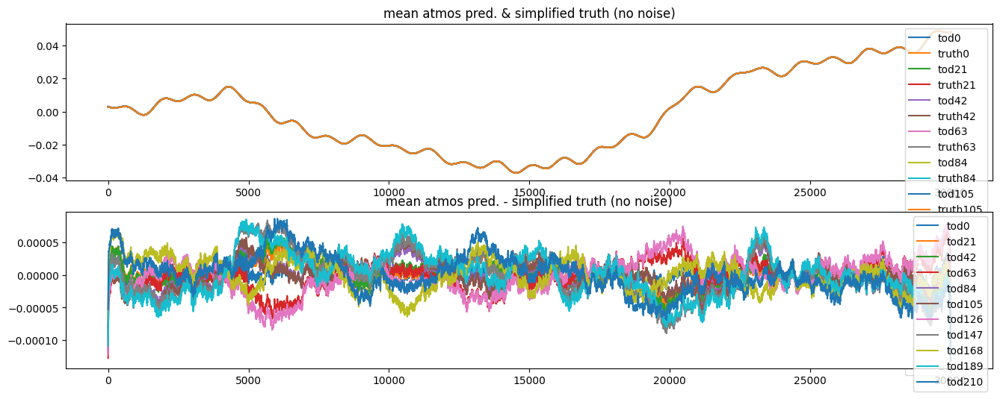

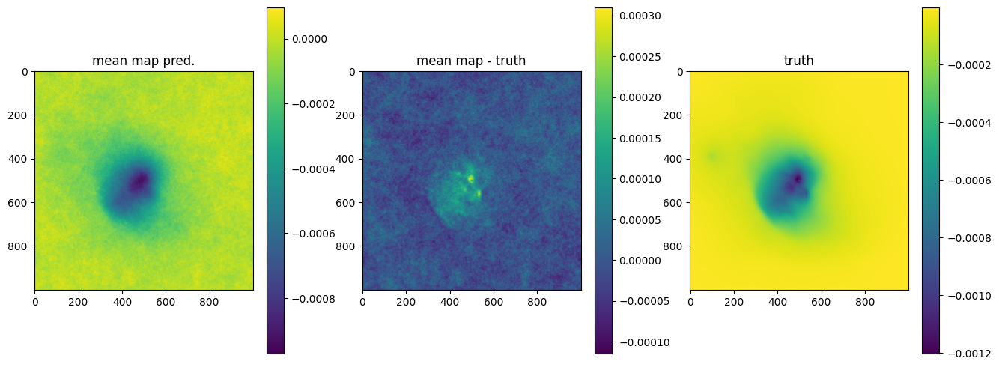

In [31]:
n_it = 20

if noiselevel == 0.0: delta = 1e-4
elif noiselevel == 0.1: delta = 1e-10
elif noiselevel == 0.5: delta = 1e-10
elif noiselevel == 1.0: delta = 1e-4
n_samples = 4 # no samples -> maximum aposteriory posterior

key, k_i, k_o = random.split(key, 3)

# callback fn for plotting during optimisation:
def callback(samples, opt_state):
    iter = opt_state[0]
    printevery = 2 #10
    if iter % printevery != 0: return

    fig_tods, axes_tods = plt.subplots(2, 1, figsize=(16, 6))
    mean, std = jft.mean_and_std(tuple(signal_response_tod(s) for s in samples))

    for i in range(0, n, n//10):
        axes_tods[0].plot(np.arange(0, mean.shape[1]), mean[i], label=f"tod{i}")
        axes_tods[0].plot(denoised_jax_tod[i], label=f"truth{i}")
        axes_tods[1].plot(np.arange(0, mean.shape[1]), mean[i] - denoised_jax_tod[i], label=f"tod{i}")
        # axes_tods[0].plot(denoised_jax_tod[i, 100:-100], label=f"truth{i}")
        # axes_tods[1].plot(np.arange(0, mean.shape[1]), mean[i] - denoised_jax_tod[i, 100:-100], label=f"tod{i}")

    axes_tods[0].title.set_text('total mean pred. & truth (no noise)')
    axes_tods[0].legend()
    axes_tods[1].title.set_text('total mean pred. - truth (no noise)')
    axes_tods[1].legend()

    fig_tods, axes_tods = plt.subplots(2, 1, figsize=(16, 6))

    preds = []
    for x in samples:
        x_tod = {k: x[k] for k in x if 'comb' in k}
        res_tods = gp_tod(x_tod)

        # From TOD-only fit:
        # preds += [res_tods[:, padding_atmos//2:-padding_atmos//2] * slopes_truth[:, None] + offset_tod_truth[:, None], ]
        preds += [res_tods[:, padding_atmos//2:-padding_atmos//2], ]

    mean_atmos, std = jft.mean_and_std(tuple(preds))

    for i in range(0, n, n//10):
        axes_tods[0].plot(np.arange(0, mean_atmos.shape[1]), mean_atmos[i], label=f"tod{i}")
        # axes_tods[0].plot(denoised_jax_tod[i], label=f"truth{i}")
        axes_tods[0].plot(atmos_tod_simplified[i], label=f"truth{i}")
        axes_tods[1].plot(np.arange(0, mean_atmos.shape[1]), mean_atmos[i] - atmos_tod_simplified[i], label=f"tod{i}")
        # axes_tods[1].plot(np.arange(0, mean_atmos.shape[1]), mean[i] - mean_atmos[i], label=f"tod{i}")

    axes_tods[0].title.set_text('mean atmos pred. & simplified truth (no noise)')
    axes_tods[0].legend()
    axes_tods[1].title.set_text('mean atmos pred. - simplified truth (no noise)')
    axes_tods[1].legend()

    fig_map, axes_map = plt.subplots(1, 3, figsize=(16, 6))

    # mean_map, _ = jft.mean_and_std(tuple(gp_map(s)[padding_map//2:-padding_map//2, padding_map//2:-padding_map//2] for s in samples))
    mean_map, _ = jft.mean_and_std(tuple(gp_map(s) for s in samples))

    im0 = axes_map[0].imshow(mean_map)
    axes_map[0].title.set_text('mean map pred.')
    fig_map.colorbar(im0)

    im1 = axes_map[1].imshow(mean_map - mapdata_truth[0, 0])
    axes_map[1].title.set_text('mean map - truth')
    fig_map.colorbar(im1)

    im2 = axes_map[2].imshow(mapdata_truth[0, 0])
    axes_map[2].title.set_text('truth')
    fig_map.colorbar(im2)

    plt.show()
    

samples, state = jft.optimize_kl(
    lh, # likelihood
    jft.Vector(lh.init(k_i)), # initial position in model space (initialisation)
    n_total_iterations=n_it, # no of optimisation steps (global)
    n_samples=n_samples, # draw samples
    key=k_o, # random jax init
    draw_linear_kwargs=dict( # sampling parameters
        cg_name="SL",
        # cg_kwargs=dict(absdelta=delta * jft.size(lh.domain) / 10.0, maxiter=60),
        cg_kwargs=dict(absdelta=delta * jft.size(lh.domain) / 10.0, maxiter=20),
    ),
    nonlinearly_update_kwargs=dict( # map from multivariate gaussian to more compl. distribution (coordinate transformations)
        minimize_kwargs=dict(
            name="SN",
            xtol=delta,
            cg_kwargs=dict(name=None),
            maxiter=5,
        )
    ),
    kl_kwargs=dict( # shift transformed multivar gauss to best match true posterior
        minimize_kwargs=dict(
            # name="M", xtol=delta, cg_kwargs=dict(name=None), maxiter=60
            name="M", xtol=delta, cg_kwargs=dict(name=None), maxiter=20
        )
    ),
    # sample_mode="nonlinear_resample", # how steps are combined (samples + nonlin + KL)
    sample_mode = lambda x: "nonlinear_resample" if x >= 1 else "linear_resample",
    callback=callback,
)

# Extended Model:

In [ ]:
samples.pos
initial_pos = {}
for k in samples.pos:
    if k == 'combcf xi':
        initial_pos[k] = jax.numpy.broadcast_to(samples.pos['combcf xi'], (n, samples.pos['combcf xi'].shape[1]))
    else:
        initial_pos[k] = samples.pos[k]

initial_pos = jft.Vector(initial_pos)

print(initial_pos)
initial_pos['combcf xi'].shape

Vector(
	{'cfmapax1fluctuations': Array(-28.38855777, dtype=float64),
	 'cfmapax1loglogavgslope': Array(4.96285501, dtype=float64),
	 'cfmapxi': Array([[  0.68293241,  12.72995411, -10.95694758, ...,  -0.76976148,
	         -2.75433528,   5.36411585],
	       [  6.96310194,  -8.80024501,   9.47281509, ...,   1.13025829,
	         -0.15382692,  -4.25647072],
	       [ -3.50276028,   5.32797145,  -8.17681113, ...,  -0.4726498 ,
	          0.99781534,   0.66676249],
	       ...,
	       [  3.09174716,  -2.25322964,   1.09685155, ...,  -3.27927712,
	          4.19404037,  -3.50987045],
	       [ -8.28650656,   9.46167015,  -5.79593651, ...,   1.86790049,
	         -5.21650567,   7.09519271],
	       [ 10.60836249, -14.80080548,   9.63134033, ...,   0.11209604,
	          4.81343084,  -6.04697123]], dtype=float64),
	 'cfmapzeromode': Array(0.67552803, dtype=float64),
	 'combcf tod fluctuations': Array(-8.17340647, dtype=float64),
	 'combcf tod loglogavgslope': Array(-1.68172426, dtype=float

(217, 40000)

In [ ]:
# put together in correlated field model
# Custom CFM:
cfm_tod = CFM("combcf ")
cfm_tod.set_amplitude_total_offset(**cf_zm_tod)
cfm_tod.add_fluctuations(
    dims_atmos, distances=1.0 / dims_atmos[0], **cf_fl_tod, prefix="tod ", non_parametric_kind="power"
)
gp_tod = cfm_tod.finalize(n)
# gp_tod = cfm_tod.finalize(1)
gp_tod

Model(
	<function CFM.finalize.<locals>.correlated_field at 0x1522e01907c0>,
	domain={'combcf tod fluctuations': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'combcf tod loglogavgslope': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'combcf xi': ShapeWithDtype(shape=(217, 40000), dtype=<class 'jax.numpy.float64'>),
	 'combcf zeromode': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>)},
	init=Initializer(
		{'combcf tod fluctuations': functools.partial(<function random_like at 0x1525f98d68e0>, primals=ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>)),
		 'combcf tod loglogavgslope': functools.partial(<function random_like at 0x1525f98d68e0>, primals=ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>)),
		 'combcf xi': functools.partial(<function random_like at 0x1525f98d68e0>, primals=ShapeWithDtype(shape=(217, 40000), dtype=<class 'jax.numpy.float64'>)),
		 'combcf zeromode': functools.partial(<function random_like at 0x1

In [34]:
signal_response_tod = Signal_TOD(gp_tod, offset_tod_truth, slopes_truth, gp_map) # combined
lh_tod = jft.Gaussian( truth, noise_cov_inv_tod).amend(signal_response_tod)

assuming a diagonal covariance matrix;
setting `std_inv` to `cov_inv(ones_like(data))**0.5`


In [35]:
x_tod = {k: initial_pos[k] for k in initial_pos if 'comb' in k}
gp_tod(x_tod).shape

(217, 40000)

OPTIMIZE_KL: Starting 0001
SL: Iteration 0 ⛰:+3.5841e+07 Δ⛰:inf ➽:1.0400e+01
SL: Iteration 1 ⛰:+3.4339e+07 Δ⛰:1.5019e+06 ➽:1.0400e+01
SL: Iteration 2 ⛰:+3.1671e+07 Δ⛰:2.6684e+06 ➽:1.0400e+01
SL: Iteration 3 ⛰:+3.2145e+06 Δ⛰:2.8456e+07 ➽:1.0400e+01
SL: Iteration 4 ⛰:+7.9141e+05 Δ⛰:2.4231e+06 ➽:1.0400e+01
SL: Iteration 5 ⛰:-1.3893e+06 Δ⛰:2.1807e+06 ➽:1.0400e+01
SL: Iteration 6 ⛰:-2.4326e+06 Δ⛰:1.0433e+06 ➽:1.0400e+01
SL: Iteration 7 ⛰:-2.4334e+06 Δ⛰:8.2573e+02 ➽:1.0400e+01
SL: Iteration 8 ⛰:-2.6767e+06 Δ⛰:2.4331e+05 ➽:1.0400e+01
SL: Iteration 9 ⛰:-3.0457e+06 Δ⛰:3.6893e+05 ➽:1.0400e+01
SL: Iteration 10 ⛰:-3.1223e+06 Δ⛰:7.6620e+04 ➽:1.0400e+01
SL: Iteration 11 ⛰:-3.5850e+06 Δ⛰:4.6269e+05 ➽:1.0400e+01
SL: Iteration 12 ⛰:-3.7081e+06 Δ⛰:1.2312e+05 ➽:1.0400e+01
SL: Iteration 13 ⛰:-3.7084e+06 Δ⛰:2.7553e+02 ➽:1.0400e+01
SL: Iteration 14 ⛰:-3.8361e+06 Δ⛰:1.2776e+05 ➽:1.0400e+01
SL: Iteration 15 ⛰:-3.9601e+06 Δ⛰:1.2394e+05 ➽:1.0400e+01
SL: Iteration 16 ⛰:-4.0072e+06 Δ⛰:4.7161e+04 ➽:1.0400e+01
SL: 

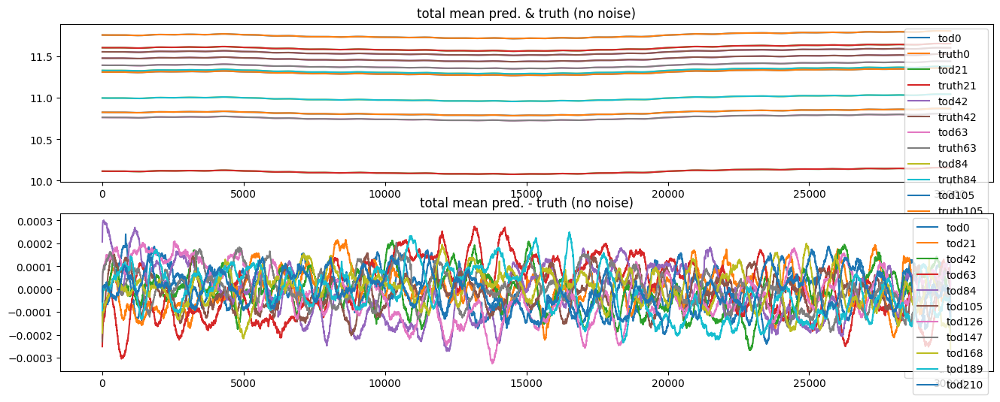

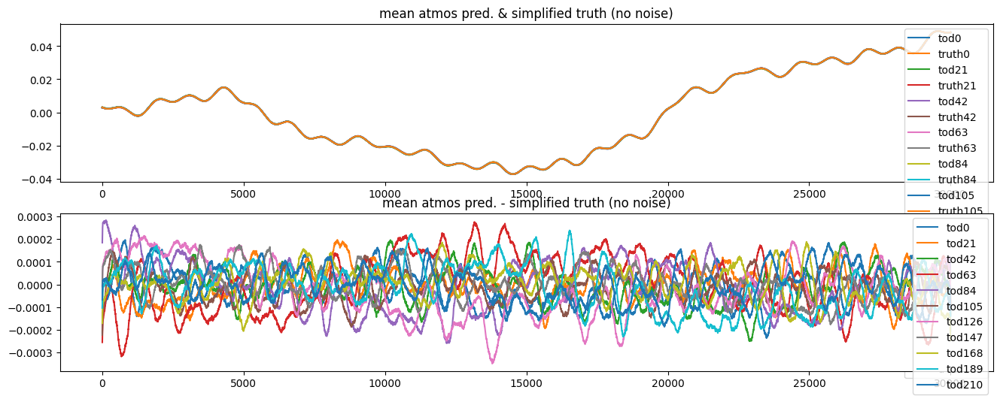

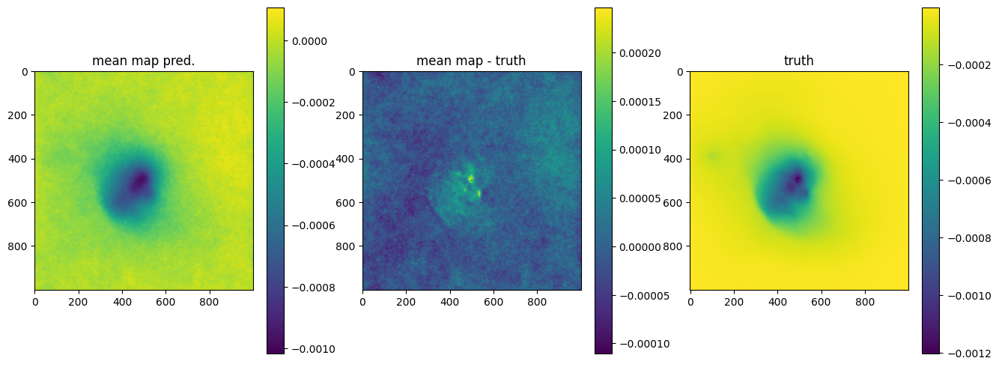

OPTIMIZE_KL: Starting 0002
SL: Iteration 0 ⛰:+1.2842e+08 Δ⛰:inf ➽:1.0400e+01
SL: Iteration 1 ⛰:+6.3922e+07 Δ⛰:6.4494e+07 ➽:1.0400e+01
SL: Iteration 2 ⛰:+5.5579e+07 Δ⛰:8.3431e+06 ➽:1.0400e+01
SL: Iteration 3 ⛰:+7.3260e+06 Δ⛰:4.8253e+07 ➽:1.0400e+01
SL: Iteration 4 ⛰:+3.2672e+06 Δ⛰:4.0588e+06 ➽:1.0400e+01
SL: Iteration 5 ⛰:-1.1271e+05 Δ⛰:3.3799e+06 ➽:1.0400e+01
SL: Iteration 6 ⛰:-1.7206e+06 Δ⛰:1.6079e+06 ➽:1.0400e+01
SL: Iteration 7 ⛰:-1.7217e+06 Δ⛰:1.1440e+03 ➽:1.0400e+01
SL: Iteration 8 ⛰:-2.0237e+06 Δ⛰:3.0201e+05 ➽:1.0400e+01
SL: Iteration 9 ⛰:-2.4732e+06 Δ⛰:4.4948e+05 ➽:1.0400e+01
SL: Iteration 10 ⛰:-2.5305e+06 Δ⛰:5.7260e+04 ➽:1.0400e+01
SL: Iteration 11 ⛰:-3.1316e+06 Δ⛰:6.0116e+05 ➽:1.0400e+01
SL: Iteration 12 ⛰:-3.2984e+06 Δ⛰:1.6679e+05 ➽:1.0400e+01
SL: Iteration 13 ⛰:-3.2986e+06 Δ⛰:1.9466e+02 ➽:1.0400e+01
SL: Iteration 14 ⛰:-3.4826e+06 Δ⛰:1.8398e+05 ➽:1.0400e+01
SL: Iteration 15 ⛰:-3.6460e+06 Δ⛰:1.6344e+05 ➽:1.0400e+01
SL: Iteration 16 ⛰:-3.7151e+06 Δ⛰:6.9074e+04 ➽:1.0400e+01
SL: 

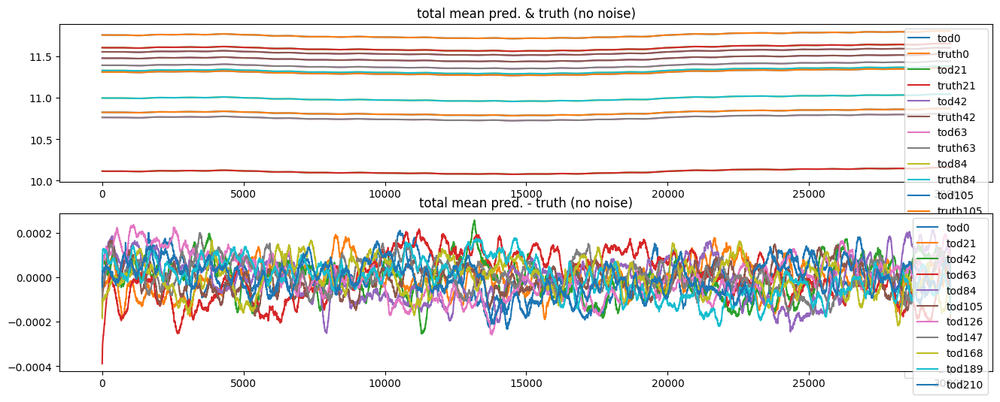

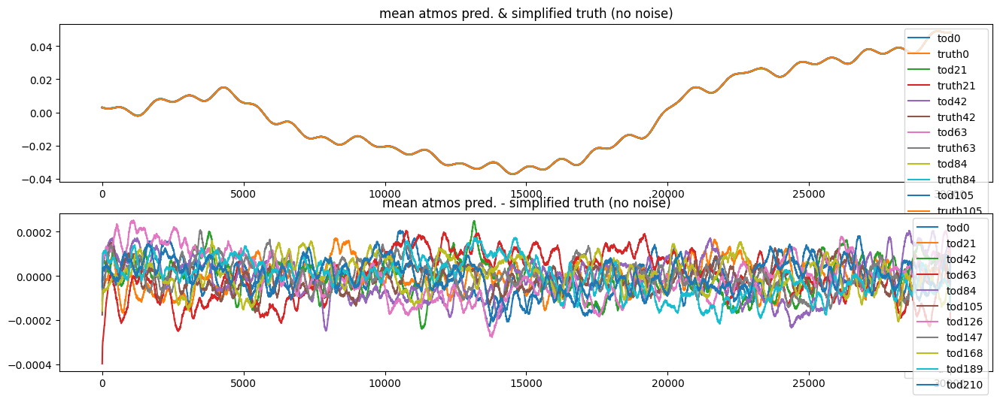

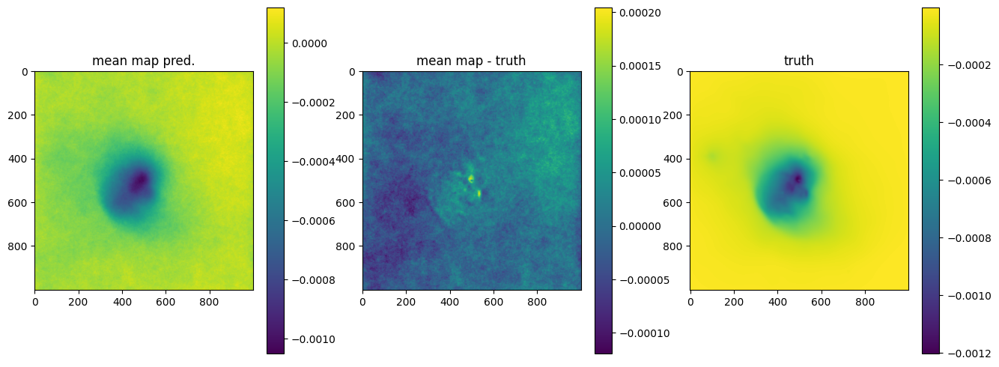

In [36]:
n_it = 2

if noiselevel == 0.0: delta = 1e-4
elif noiselevel == 0.1: delta = 1e-10
elif noiselevel == 0.5: delta = 1e-10
elif noiselevel == 1.0: delta = 1e-4
n_samples = 4 # no samples -> maximum aposteriory posterior

key, k_i, k_o = random.split(key, 3)

# callback fn for plotting during optimisation:
def callback(samples, opt_state):
    iter = opt_state[0]
    printevery = 1 #10
    if iter % printevery != 0: return

    fig_tods, axes_tods = plt.subplots(2, 1, figsize=(16, 6))
    mean, std = jft.mean_and_std(tuple(signal_response_tod(s) for s in samples))

    for i in range(0, n, n//10):
        axes_tods[0].plot(np.arange(0, mean.shape[1]), mean[i], label=f"tod{i}")
        axes_tods[0].plot(denoised_jax_tod[i], label=f"truth{i}")
        axes_tods[1].plot(np.arange(0, mean.shape[1]), mean[i] - denoised_jax_tod[i], label=f"tod{i}")
        # axes_tods[0].plot(denoised_jax_tod[i, 100:-100], label=f"truth{i}")
        # axes_tods[1].plot(np.arange(0, mean.shape[1]), mean[i] - denoised_jax_tod[i, 100:-100], label=f"tod{i}")

    axes_tods[0].title.set_text('total mean pred. & truth (no noise)')
    axes_tods[0].legend()
    axes_tods[1].title.set_text('total mean pred. - truth (no noise)')
    axes_tods[1].legend()

    fig_tods, axes_tods = plt.subplots(2, 1, figsize=(16, 6))

    preds = []
    for x in samples:
        x_tod = {k: x[k] for k in x if 'comb' in k}
        res_tods = gp_tod(x_tod)

        # From TOD-only fit:
        # preds += [res_tods[:, padding_atmos//2:-padding_atmos//2] * slopes_truth[:, None] + offset_tod_truth[:, None], ]
        preds += [res_tods[:, padding_atmos//2:-padding_atmos//2], ]

    mean_atmos, std = jft.mean_and_std(tuple(preds))

    for i in range(0, n, n//10):
        axes_tods[0].plot(np.arange(0, mean_atmos.shape[1]), mean_atmos[i], label=f"tod{i}")
        # axes_tods[0].plot(denoised_jax_tod[i], label=f"truth{i}")
        axes_tods[0].plot(atmos_tod_simplified[i], label=f"truth{i}")
        axes_tods[1].plot(np.arange(0, mean_atmos.shape[1]), mean_atmos[i] - atmos_tod_simplified[i], label=f"tod{i}")
        # axes_tods[1].plot(np.arange(0, mean_atmos.shape[1]), mean[i] - mean_atmos[i], label=f"tod{i}")

    axes_tods[0].title.set_text('mean atmos pred. & simplified truth (no noise)')
    axes_tods[0].legend()
    axes_tods[1].title.set_text('mean atmos pred. - simplified truth (no noise)')
    axes_tods[1].legend()

    fig_map, axes_map = plt.subplots(1, 3, figsize=(16, 6))

    # mean_map, _ = jft.mean_and_std(tuple(gp_map(s)[padding_map//2:-padding_map//2, padding_map//2:-padding_map//2] for s in samples))
    mean_map, _ = jft.mean_and_std(tuple(gp_map(s) for s in samples))

    im0 = axes_map[0].imshow(mean_map)
    axes_map[0].title.set_text('mean map pred.')
    fig_map.colorbar(im0)

    im1 = axes_map[1].imshow(mean_map - mapdata_truth[0, 0])
    axes_map[1].title.set_text('mean map - truth')
    fig_map.colorbar(im1)

    im2 = axes_map[2].imshow(mapdata_truth[0, 0])
    axes_map[2].title.set_text('truth')
    fig_map.colorbar(im2)

    plt.show()
    

samples, state = jft.optimize_kl(
    # lh, # likelihood
    # jft.Vector(lh.init(k_i)), # initial position in model space (initialisation) # TODO: replace!!
    lh_tod,
    initial_pos,
    n_total_iterations=n_it, # no of optimisation steps (global)
    n_samples=n_samples, # draw samples
    key=k_o, # random jax init
    draw_linear_kwargs=dict( # sampling parameters
        cg_name="SL",
        # cg_kwargs=dict(absdelta=delta * jft.size(lh.domain) / 10.0, maxiter=60),
        cg_kwargs=dict(absdelta=delta * jft.size(lh.domain) / 10.0, maxiter=20),
    ),
    nonlinearly_update_kwargs=dict( # map from multivariate gaussian to more compl. distribution (coordinate transformations)
        minimize_kwargs=dict(
            name="SN",
            xtol=delta,
            cg_kwargs=dict(name=None),
            maxiter=5,
        )
    ),
    kl_kwargs=dict( # shift transformed multivar gauss to best match true posterior
        minimize_kwargs=dict(
            # name="M", xtol=delta, cg_kwargs=dict(name=None), maxiter=60
            name="M", xtol=delta, cg_kwargs=dict(name=None), maxiter=20
        )
    ),
    sample_mode="nonlinear_resample", # how steps are combined (samples + nonlin + KL)
    # sample_mode = lambda x: "nonlinear_resample" if x >= 1 else "linear_resample",
    callback=callback,
)

In [37]:
printfitresults()

Fit Results (res, init, std)

TODs:
	fluctuations: 0.001112236101054367, 0.0015, 0.0001
	loglogvarslope: -2.5791424277067074, -2.45, 0.1
	zeromode std (LogNormal): 6.193593996878971e-06, 1e-05, 9.9e-06
map:
	fluctuations: 3.207274273704672e-05, 5.6e-05, 1e-06
	loglogvarslope: -1.9575778750705268, -2.5, 0.1
	zeromode std (LogNormal): 2.709697531355138e-12, 1e-08, 1e-07


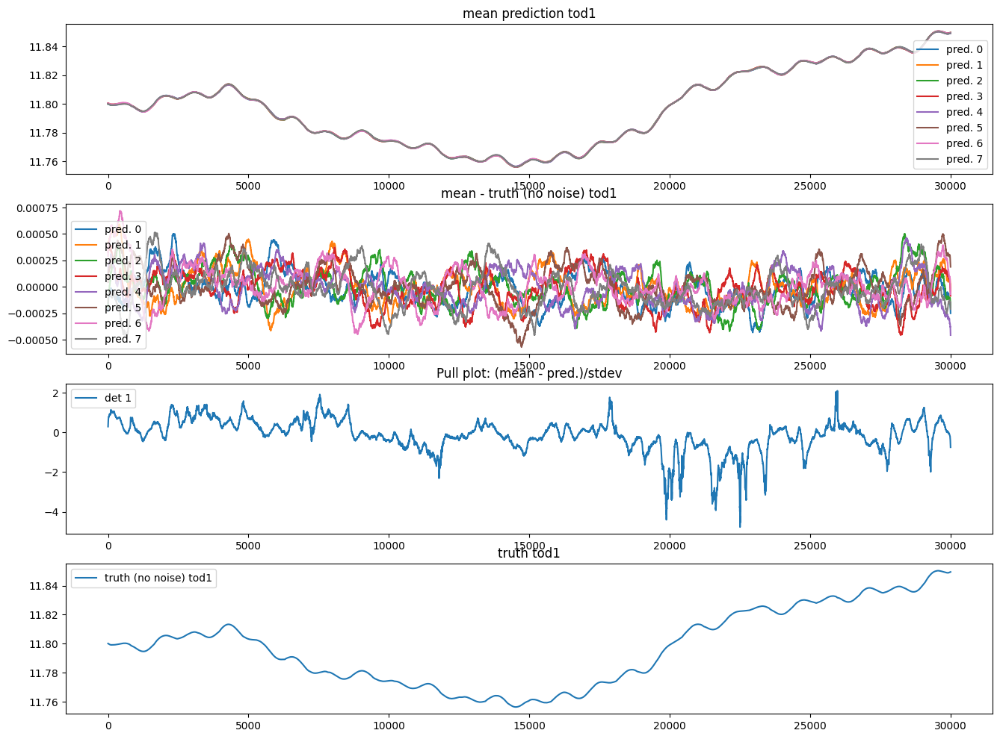

In [38]:
mean, std = jft.mean_and_std(tuple(signal_response_tod(s) for s in samples))

fig, axes = plt.subplots(4, 1, figsize=(16, 12))
i = 1 # TOD id
j = 0
# for i in range(mean.shape[0]):
for s in samples:
    pred = signal_response_tod(s)
    
    im0 = axes[0].plot(np.arange(0, pred.shape[1]), pred[i], label=f"pred. {j}")
    im1 = axes[1].plot(np.arange(0, pred.shape[1]), pred[i] - denoised_jax_tod[i], label=f"pred. {j}")
    # im1 = axes[1].plot(np.arange(0, pred.shape[1]), pred[i] - denoised_jax_tod[i, 100:-100], label=f"pred. {j}")
    j += 1

im2 = axes[2].plot(np.arange(0, pred.shape[1]), (mean[i] - denoised_jax_tod[i])/std[i], label=f"det {i}")
# im2 = axes[2].plot(np.arange(0, pred.shape[1]), (mean[i] - denoised_jax_tod[i, 100:-100])/std[i], label=f"det {i}")
im3 = axes[3].plot(denoised_jax_tod[i], label=f"truth (no noise) tod{i}")
axes[0].title.set_text(f"mean prediction tod{i}")
axes[0].legend()
axes[1].title.set_text(f"mean - truth (no noise) tod{i}")
axes[1].legend()
axes[2].title.set_text(f"Pull plot: (mean - pred.)/stdev")
axes[2].legend()
axes[3].title.set_text(f"truth tod{i}")
axes[3].legend()

plt.show()

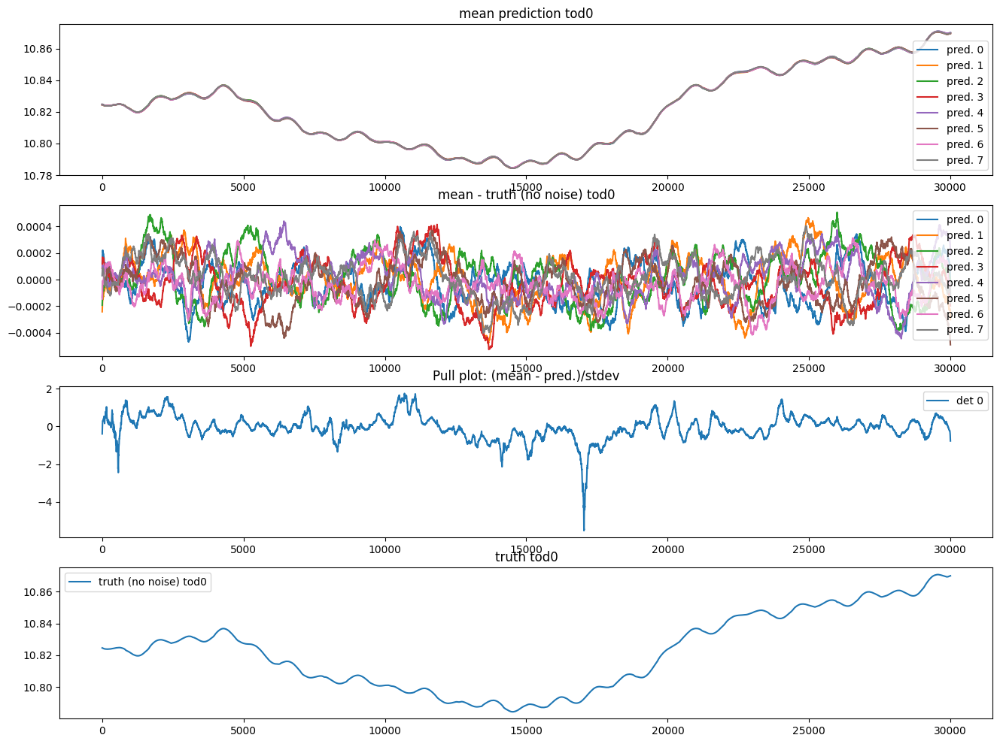

In [39]:
mean, std = jft.mean_and_std(tuple(signal_response_tod(s) for s in samples))

fig, axes = plt.subplots(4, 1, figsize=(16, 12))
i = 0 # TOD id
j = 0
# for i in range(mean.shape[0]):
for s in samples:
    pred = signal_response_tod(s)
    
    im0 = axes[0].plot(np.arange(0, pred.shape[1]), pred[i], label=f"pred. {j}")
    im1 = axes[1].plot(np.arange(0, pred.shape[1]), pred[i] - denoised_jax_tod[i], label=f"pred. {j}")
    # im1 = axes[1].plot(np.arange(0, pred.shape[1]), pred[i] - denoised_jax_tod[i, 100:-100], label=f"pred. {j}")
    j += 1

im2 = axes[2].plot(np.arange(0, pred.shape[1]), (mean[i] - denoised_jax_tod[i])/std[i], label=f"det {i}")
# im2 = axes[2].plot(np.arange(0, pred.shape[1]), (mean[i] - denoised_jax_tod[i, 100:-100])/std[i], label=f"det {i}")
im3 = axes[3].plot(denoised_jax_tod[i], label=f"truth (no noise) tod{i}")
axes[0].title.set_text(f"mean prediction tod{i}")
axes[0].legend()
axes[1].title.set_text(f"mean - truth (no noise) tod{i}")
axes[1].legend()
axes[2].title.set_text(f"Pull plot: (mean - pred.)/stdev")
axes[2].legend()
axes[3].title.set_text(f"truth tod{i}")
axes[3].legend()

plt.show()

## Compare with maria mapper:

In [40]:
from maria.mappers import BinMapper

mapper = BinMapper(center=(150, 10),
                   frame="ra_dec",
                   width=0.1,
                   height=0.1,
                   resolution=2e-4,
                   tod_preprocessing={
                        "window": {"name": "hamming"},
                        "remove_modes": {"modes_to_remove": [0]},
                        "despline": {"knot_spacing": 10},
                    },
                    map_postprocessing={
                        "gaussian_filter": {"sigma": 1},
                        "median_filter": {"size": 1},
                    },
                  )

mapper.add_tods(tod_truthmap)
output_map = mapper.run()

Running mapper (m2/f093): 100%|██████████| 1/1 [00:08<00:00,  8.89s/it]


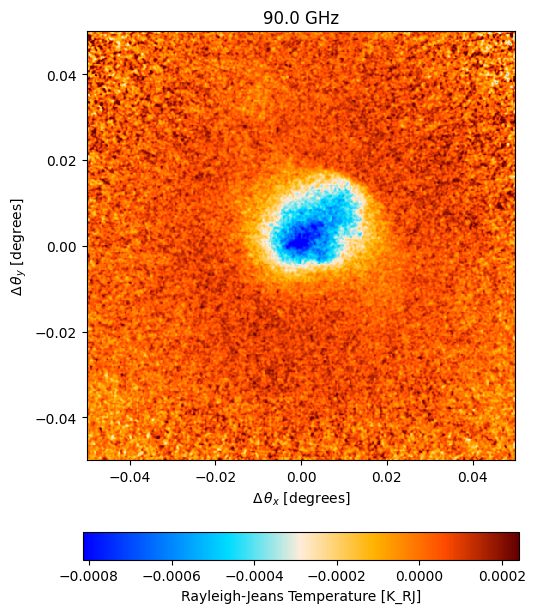

In [41]:
output_map.plot()

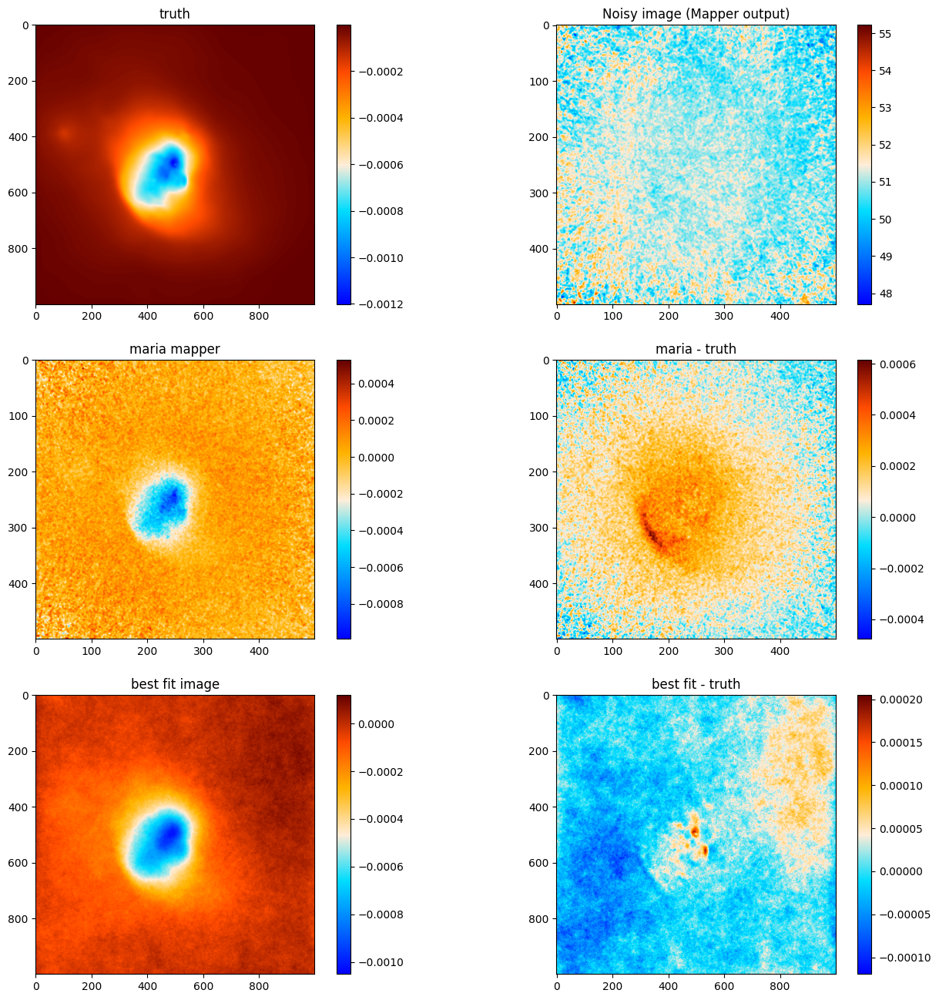

In [42]:
from skimage.transform import resize

# Compare nifty vs maria
# sig_map = gp_map(samples.pos)[padding_map//2:-padding_map//2, padding_map//2:-padding_map//2] # when splitting up in different field models
sig_map = gp_map(samples.pos)
# mincol = -0.0012
# maxcol = 0.
mincol = None
maxcol = None

cmb_cmap = plt.get_cmap('cmb')
fig, axes = plt.subplots(3, 2, figsize=(16, 16))

im0 = axes[0,0].imshow( mapdata_truth[0,0] , cmap=cmb_cmap, vmin=mincol, vmax=maxcol)
axes[0,0].title.set_text('truth')
fig.colorbar(im0)

im1 = axes[0,1].imshow(output_truthmap.data[0,0], cmap=cmb_cmap, vmin=mincol, vmax=maxcol)
fig.colorbar(im1)
axes[0,1].title.set_text("Noisy image (Mapper output)")

im2 = axes[1,0].imshow(output_map.data[0, 0], cmap=cmb_cmap, vmin=mincol, vmax=maxcol)
axes[1,0].title.set_text('maria mapper')
fig.colorbar(im2)

truth_rescaled = resize(mapdata_truth[0,0], (500, 500), anti_aliasing=True)
im3 = axes[1,1].imshow((output_map.data[0, 0] - truth_rescaled), cmap=cmb_cmap, vmin=mincol, vmax=maxcol)
axes[1,1].title.set_text('maria - truth')
fig.colorbar(im3)

im3 = axes[2,0].imshow(sig_map, cmap=cmb_cmap, vmin=mincol, vmax=maxcol)
axes[2,0].title.set_text('best fit image')
fig.colorbar(im3)

im4 = axes[2,1].imshow((sig_map - mapdata_truth[0,0]), cmap=cmb_cmap, vmin=mincol, vmax=maxcol)
axes[2,1].title.set_text('best fit - truth')
fig.colorbar(im4)

plt.show()

## Compare with smoothed truth

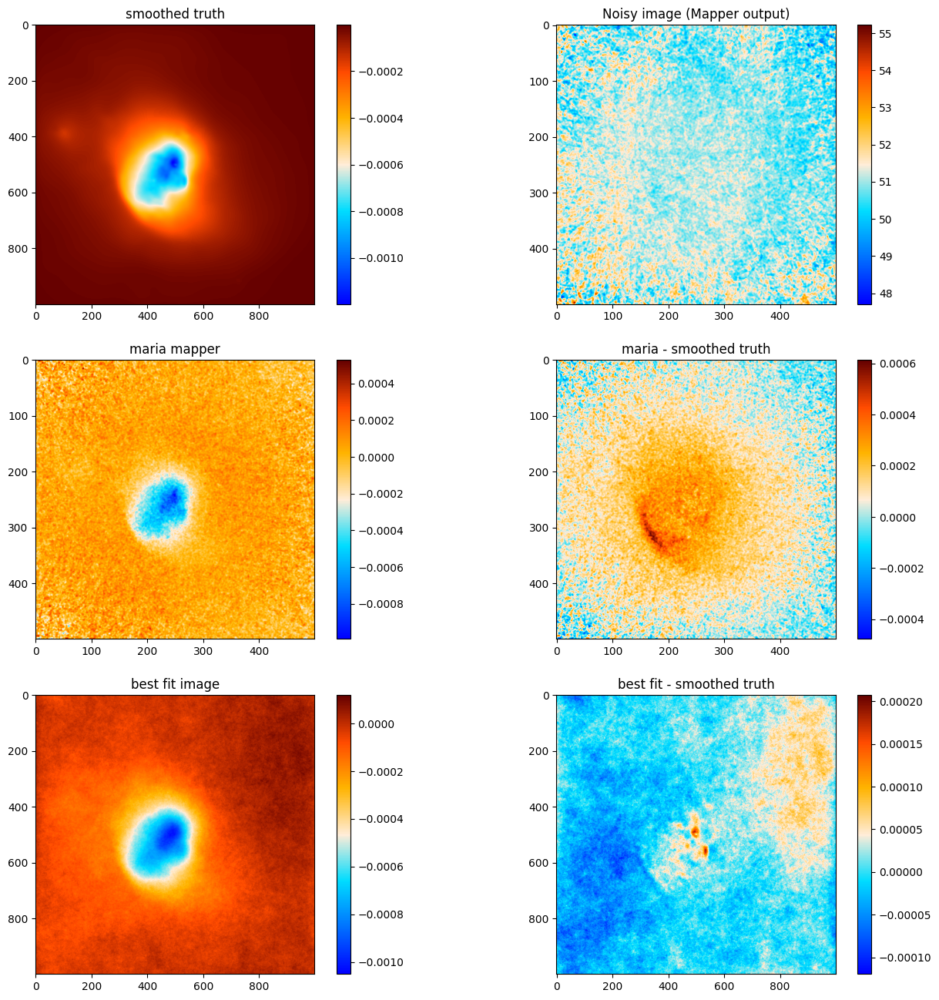

In [58]:
from skimage.transform import resize
from scipy.ndimage import uniform_filter

# Compare nifty vs maria
# sig_map = gp_map(samples.pos)[padding_map//2:-padding_map//2, padding_map//2:-padding_map//2] # when splitting up in different field models
sig_map = gp_map(samples.pos)
# mincol = -0.0012
# maxcol = 0.
mincol = None
maxcol = None

smoothed_truth = uniform_filter(mapdata_truth[0,0], size=4)
# smoothed_truth = output_map_truth.data[0,0]

cmb_cmap = plt.get_cmap('cmb')
fig, axes = plt.subplots(3, 2, figsize=(16, 16))

im0 = axes[0,0].imshow( smoothed_truth , cmap=cmb_cmap, vmin=mincol, vmax=maxcol)
axes[0,0].title.set_text('smoothed truth')
fig.colorbar(im0)

im1 = axes[0,1].imshow(output_truthmap.data[0,0], cmap=cmb_cmap, vmin=mincol, vmax=maxcol)
fig.colorbar(im1)
axes[0,1].title.set_text("Noisy image (Mapper output)")

im2 = axes[1,0].imshow(output_map.data[0, 0], cmap=cmb_cmap, vmin=mincol, vmax=maxcol)
axes[1,0].title.set_text('maria mapper')
fig.colorbar(im2)

truth_rescaled = resize(smoothed_truth, (500, 500), anti_aliasing=True)
im3 = axes[1,1].imshow((output_map.data[0, 0] - truth_rescaled), cmap=cmb_cmap, vmin=mincol, vmax=maxcol)
axes[1,1].title.set_text('maria - smoothed truth')
fig.colorbar(im3)

im3 = axes[2,0].imshow(sig_map, cmap=cmb_cmap, vmin=mincol, vmax=maxcol)
axes[2,0].title.set_text('best fit image')
fig.colorbar(im3)

im4 = axes[2,1].imshow((sig_map - smoothed_truth), cmap=cmb_cmap, vmin=mincol, vmax=maxcol)
axes[2,1].title.set_text('best fit - smoothed truth')
fig.colorbar(im4)

plt.show()